# Computational Physics: Lid-Driven Cavity Flow
***
## apjsidhu
## Note: it is advised not to click 'Run All', as the simulations can take over an hour to run (will be a few hours in total). All the graphs have already been plotted.
### In this version, the saving of data and figures has been set to False (i.e. data and figures are not saved). Furthermore, ensure to use the correct loading directories, as the ones used here are for my computer. To load the pickle files provided in the final assignment upload, place them into the same folder as this notebook, or write your own directory. 
***
## Overview
The following notebook investigates lid-driven cavity flow, a common problem in (computational) fluid dynamics. The problem is as follows. A square cavity of sides $l_x=l_y$ has a top boundary (lid) that is driven at a constant velocity $V_\textrm{wall}$ in the $x$-direction. The aim then is to solve the vorticity form of the Navier-Stokes equation to acquire the stream function $u$ and the vorticity $w$. From these, the $x$- and $y$-direction velocities, $V_x$ and $V_y$ respectively can be determined. The computational domain is given in the PDF in the same Github repository.

The domain divides the cavity into an $N\times N$ grid, with the $x$-direction denoted by the $i$th cell, and the $y$-direction being denoted by the $j$th cell. The distance between the centre of each cell is $h$ (and thus each cell has a width of $h$). This gives for $x$ and $y$ then $$x=ih$$ $$y=jh.$$ Further on, a velocity will also be given to the bottom wall, and the equivalent analysis applied.

## Vorticity Form of Navier-Stokes Equations
The vorticity form of the Navier-Stokes equations is given by 
$$\frac{\partial^2 u}{\partial x^2}+\frac{\partial^2 u}{\partial y^2}=-w$$ 

$$\frac{\partial w}{\partial t}=-\frac{\partial u}{\partial y}\frac{\partial w}{\partial x}+\frac{\partial u}{\partial x}\frac{\partial w}{\partial y}+\frac{1}{Re}\bigg(\frac{\partial^2 w}{\partial x^2}+\frac{\partial^2 w}{\partial y^2}\bigg).$$ 

These have to be discretised before implementation. A central-difference approximation is used for the spatial derivatives, and a forward-difference approximation is used for the time derivatives. The results of this discretisation are

$$u^n_{i,\,j}=\frac{1}{4}\big(h^2w^n_{i,\,j}+u^n_{i+1,\,j}+u^n_{i-1,\,j}+u^n_{i,\,j+1}+u^n_{i,\,j-1}\big)$$
$$w^{n+1}_{i,\,j}=w^n_{i,\,j}+\Delta t\Bigg[\bigg(\frac{w^n_{i+1,\,Fj}+w^n_{i-1,\,j}+w^n_{i,\,j+1}+w^n_{i,\,j-1}-4w^n_{i,j}}{h^2Re}\bigg)+ \frac{\big(u^n_{i+1,\,j}-u^n_{i-1,\,j}\big)\big(w^n_{i,\,j+1}-w^n_{i,\,j-1}\big)-\big(u^n_{i,\,j+1}-u^n_{i,\,j-1}\big)\big(w^n_{i+1,\,j}-w^n_{i-1,\,j}\big)}{4h^2}\Bigg]$$

where the superscript $n$ denotes the $n$th time step, $\Delta t$ is the time discretisation (such that at some time $t=n\Delta t$), and the subscript $i$ and $j$ are the spatial steps in the domain, as explained before. There are more discretised equations for the boundary conditions, the velocities, and the pressure, but for brevity they have been omitted from this notebook. Please refer to the accompanying report, *Lid-Driven Cavity Flow*, for more information on the discretisation process and results. 
## Important Notes
The arrays in this notebook are $\texttt{numpy}$ arrays. Numpy uses matrix indexing, such that in the indices $[i,\,j]$, $i$ denotes the $i$th row and $j$ denotes the $j$th column. As seen above, the computational domain described in this problem utilises *Cartesian* indexing, whereby in $[i,\,j]$, $i$ denotes the $i$th column ($x$-axis) and $j$ denotes the $j$th row ($y$-axis). Thus, for all computational purposes, the indices in the $\texttt{numpy}$ arrays are flipped from their theoretically derived counterparts. For example, the stream function $u^n_{i,\,j}$ given above, will be indexed in numpy as (for the $n$th time step) $u[j,\,i]$ for the same values of $j$ and $i$. 

If you have .pickle files for the data, and are analysing some Reynolds number and $V_\textrm{bot}$, you can only load one pickle file at a time using the Results calling methods used later on in this notebook. You can call more than one pickle file if you change the name of the dictionary Results to reflect the conditions of each run (e.g. to ResultsRe10_Vbot0) but this was avoided for brevity. 

# Building Navier-Stokes Solver
### Notation
Below, unless otherwise stated, are the definitions of the notation seen in the code
* `Re`: Reynolds number
* `u`: stream function;
* `w`: vorticity;
* `Vx`: $x$-direction velocity. `Vxx` and `Vxn` are also used within the velocity function. This is to avoid accidentally calling any global variables within the function;
* `Vy`: $y$-direction velocity. Read above regarding `Vyy` and `Vyn`;
* `p`: pressure
* `h`: spatial discretisation;
* `dt`: time discretisation
* `N`: number of grids along one axis ($N\times N$ domain grid);
* `Nt`: total number of time steps. Total in-simulation time is then `T=Nt*dt`;
* `l` : distance of domain along one axis. Domain is a 1$\times$1 square, so `l=1`;
* `Vtop`: velocity $V_\textrm{wall}$ of the top wall;
* `Vbot`: velocity of the bottom wall.
* `bottomVel`: logical value. If `True` then the bottom wall moves with a velocity `Vbot`. If `False` then the bottom wall is static. The purpose of `bottomVel` is to act as a second check for the bottom wall velocity. If a user forgets to set `Vbot=0`, but `bottomVel` is still set to `False`, then `Vbot` is effectively 0. While not as efficient, it takes hardly any time extra to check, and makes the Navier-Stokes Solver more thorough;
* `omega`: convergence amplification factor for successive over-relaxation;
* `epsilon`: tolerance level for error in SOR.

### Import Libraries and Packages

In [1]:
import numpy as np
import numpy.linalg as npla
import math
import matplotlib.pyplot as plt
import matplotlib.cm  as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import time
import itertools
#import scipy.signal as scpsi
import pickle
import scipy
import scipy.optimize

In [2]:
# This is to just set the plotting fonts, font size, etc.
font = {'family' : 'serif'}
        #'weight' : 'bold',
        #'size'   : 16}

plt.rc('font', **font)
plt.rcParams['xtick.major.pad']=4
plt.rcParams['ytick.major.pad']=4

### Discretised Functions

#### Residual Function

In [3]:
def Residuals(f_new, f_old, omega=1):
    # In the successive over-relaxation, an omega factor is included. This is initially set to 1
    # To accelerate convergence, this amplification factor omega can be increased or decreased
    #residual = (1/omega) * npla.norm(f_new-f_old) # another method using norm instead of mean, but longer computing times
    # Successive relaxation is used in this project, so omega=1 for the whole notebook
    
    residual = (1/omega) * np.mean(np.absolute(f_new - f_old))
    
    return residual

#### Stream Function

In [4]:
def stream_func_solver(u, w, h, epsilon, maxIters):
    # This iteration number is included to ensure the code remains efficient in execution 
    # If iteration exceeds maxIters, then the successive over-relaxation stops
    iteration = 0
    
    while True:
        # Make a copy to avoid recursions
        u_copy = np.copy(u)
    
        # Boundary conditions - 
        u[:,0]   = 0 # Left wall
        u[:, -1] = 0 # Right wall
    
        u[-1, :] = 0 # Bottom wall
        u[0, :]  = 0 # Top wall
    
        # For the stream function relaxation, i, j goes from 1:-1, as only the interior is wanted (boundaries ignored)
        # [i, j] = [1:-1, 1:-1] 
    
        # Since [i,j] in the domain/Cartesian indexing is [j, i] in numpy matrix indexing:
        # Cartesian = Numpy
        # [i+1, j]  = [1:-1, 2:]
        # [i-1, j]  = [1:-1, 0:-2]
    
        # [i, j+1]  = [2:, 1:-1]
        # [i, j-1]  = [0:-2, 1:-1]
    
        # Update the stream function using the discretised stream function equation
        u[1:-1, 1:-1] = (1/4) * ((h*h*w[1:-1,1:-1]) + u_copy[1:-1, 2:] + u_copy[1:-1, 0:-2] \
                                 + u_copy[2:, 1:-1] + u_copy[0:-2, 1:-1])
        
        residual = Residuals(u, u_copy)
        iteration += 1
        
        if residual < epsilon or iteration+1 > maxIters:
            break 

    return u, residual

#### Vorticity

In [5]:
def vort_update(u, w, h, dt, Re, Vtop, Vbot, bottomVel):
    # Make a copy such that the original array is not modified, but can still be called,
    # to avoid mistakes and recursions
    w_new = np.copy(w)
    
    
    # Boundaries for w
    w_new[:, 0] = (2/(h*h)) * (u[:,0] - u[:, 1])                        # Left wall
    
    # Check value of bottomVel
    if bottomVel:
        w_new[-1, :] = (2/(h*h)) * (u[-1,:] - u[-2,:]) - ((2/h) * Vbot) # Bottom wall
    else:
        w_new[-1, :] = (2/(h*h)) * (u[-1,:] - u[-2,:])                  # Bottom wall
    
    w_new[:, -1] = (2/(h*h)) * (u[:,-1] - u[:, -2])                     # Right wall
        
    w_new[0, :] = (2/(h*h)) * (u[0,:] - u[1, :]) + ((2/h) * Vtop)       # Top wall
    
    
    
    # For the vorticity relaxation, i, j goes from 1:-1, as only the interior is wanted (boundaries ignored)
    # [i, j] = [1:-1, 1:-1] 
    
    # Since [i,j] in the domain/Cartesian indexing is [j, i] in numpy matrix indexing:
    # Cartesian = Numpy
    # [i+1, j]  = [1:-1, 2:]
    # [i-1, j]  = [1:-1, 0:-2]
    
    # [i, j+1]  = [2:, 1:-1]
    # [i, j-1]  = [0:-2, 1:-1]
    
    # Update the vorticity using the discretised vorticity equation
    # (separated terms to avoid mistakes and confusion)
    A = (w[1:-1, 2:] + w[1:-1, 0:-2] + w[2:, 1:-1] + w[0:-2, 1:-1] - (4 * w[1:-1, 1:-1])) * (dt / (h*h*Re))
    
    B = (((u[1:-1, 2:]-u[1:-1, 0:-2])*(w[2:, 1:-1]-w[0:-2, 1:-1])) - \
        ((u[2:, 1:-1]-u[0:-2, 1:-1]) *(w[1:-1, 2:]-w[1:-1, 0:-2]))) * (dt/(4*h*h))
    
    
    w_new[1:-1, 1:-1] = w[1:-1, 1:-1] + A + B
    
    return w_new

#### Velocities

In [6]:
def velocity_update(u, h, Vxx, Vyy, Vtop, Vbot, bottomVel):
    # Make copies such that the original arrays are not modified, but can still be called,
    # to avoid mistakes and recursions
    Vxn = np.copy(Vxx)
    Vyn = np.copy(Vyy)
    
    # Boundary conditions for x-direction velocities
    Vxn[:,0]   = 0                  # Left wall
    
    # Check value of bottomVel
    if bottomVel:
        Vxn[-1,:] = Vbot            # Bottom wall
    else:
        Vxn[-1, :] = 0              # Bottom wall
    
    Vxn[:, -1] = 0                  # Right wall
    Vxn[0, :]  = Vtop               # Top wall
    
    
    # Boundary conditions for y-direction velocities
    Vyn[:,0]   = 0 # Left wall
    Vyn[-1, :] = 0 # Bottom wall
    Vyn[:, -1] = 0 # Right wall
    Vyn[0, :]  = 0 # Top wall
    
    
    # For the velocity relaxation, i, j goes from 1:-1, as only the interior is wanted (boundaries ignored)
    # [i, j] = [1:-1, 1:-1] 
    
    # Since [i,j] in the domain/Cartesian indexing is [j, i] in numpy matrix indexing:
    # Cartesian = Numpy
    # [i+1, j]  = [1:-1, 2:]
    # [i-1, j]  = [1:-1, 0:-2]
    
    # [i, j+1]  = [2:, 1:-1]
    # [i, j-1]  = [0:-2, 1:-1]
    
    # Update the velocities using discretised equations for velocity
    Vxn[1:-1, 1:-1] = (u[2:, 1:-1] - u[0:-2, 1:-1]) / (2*h)
    Vyn[1:-1, 1:-1] = -(u[1:-1, 2:] - u[1:-1, 0:-2]) / (2*h)
    
    return Vxn, Vyn

#### Velocity Probe

In [7]:
def velocity_probe(Vxx_history, Nt, dt, tolerance):
    # The tolerance is that for Ax - at what point can Ax be considered
    # a steady-state condition? 0 ideally, but 1e-6, for example can be used
    # Create an acceleration array
    Axx = np.zeros([Nt])
    
    # Since boundaries are included, pad the arrays
    Vxx_hist_pad = np.pad(Vxx_history, 1)
    Axx_pad = np.pad(Axx, 1)
    
    # Use forward difference for the time derivative
    Axx_pad[1:-1] = (Vxx_hist_pad[2:] - Vxx_hist_pad[1:-1]) / dt
    
    # Unpad the arrays
    Axx = Axx_pad[1:-1]
    # Remove last boundary (since the last Vxx_hist is 0, this will give
    # the second last Vxx_hist as the last value of Axx, 
    # so we remove this by equating it to the previous value)
    Axx[-1] = Axx[-2]    
    
    # Check the time (i.e. index) at which Axx reduces to below the tolerance
    T0index = np.argmax(np.absolute(Axx[::-1])>tolerance)
    if T0index == 0:
        print('The tolerance is too low/ high, and is not present in the acceleration array.')
    # Since the array above is reversed, subtract from Nt, to get the actual time index
    T0index = Nt - T0index
    # The time at which the tolerance is reached (in seconds)
    T0time = T0index * dt

    return Axx, T0index, T0time

#### Pressure

In [8]:
def pressure_update(p, w, h, Vxx, Vyy):
    p_new = np.copy(p)
    # Make a copy such that the original array is not modified, but can still be called,
    # to avoid mistakes and recursions
    
    # BOUNDARY CONDITIONS
    # Since the boundary conditions for pressure are recursive, numpy slicing requires
    # a padding to refer to the boundaries as an interior. The padding is a border of 
    # zeros around the array. Refer to the corresponding report for further information 
    # on padding
    p_pad = np.pad(p_new, pad_width=1, mode='constant', constant_values=0)
    p_new = np.pad(p_new, pad_width=1, mode='constant', constant_values=0)
    w_pad = np.pad(w, pad_width=1, mode='constant', constant_values=0)

    # Set the boundary conditions 
    p_new[2:, 1] = p_pad[1:-1, 1] + ((1/Re) * (w_pad[1:-1, 2] - w_pad[1:-1, 1]))     # Left wall
    p_new[-2, 2:] = p_pad[-2, 1:-1] - ((1/Re) * (w_pad[-2, 1:-1] - w_pad[-3, 1:-1])) # Bottom wall
    p_new[2:, -2] = p_pad[1:-1, -2] + ((1/Re) * (w_pad[1:-1, -2] - w_pad[1:-1, -3])) # Right wall
    p_new[1, 2:] = p_pad[1, 1:-1] - ((1/Re) * (w_pad[2,1:-1] - w_pad[1, 1:-1]))      # Top wall

    p_new = p_new[1:-1, 1:-1]

    # For the pressure relaxation, i, j goes from 1:-1, as only the interior is wanted (boundaries ignored)
    # [i, j] = [1:-1, 1:-1] 
    
    # Since [i,j] in the domain/Cartesian indexing is [j, i] in numpy matrix indexing:
    # Cartesian = Numpy
    # [i+1, j]  = [1:-1, 2:]
    # [i-1, j]  = [1:-1, 0:-2]
    
    # [i, j+1]  = [2:, 1:-1]
    # [i, j-1]  = [0:-2, 1:-1]
    
    # Update the pressure using the discretised pressure equation 
    # (separated terms to avoid mistakes and confusion)
    AA = p[1:-1, 2:] + p[1:-1, 0:-2] + p[2:, 1:-1] + p[0:-2, 1:-1]
    
    BB = -((Vyy[1:-1, 2:]-Vyy[1:-1, 0:-2]) * (Vxx[2:, 1:-1]-Vxx[0:-2, 1:-1]))/(4*h*h)
    
    CC = ((Vxx[1:-1, 2:]-Vxx[1:-1, 0:-2]) / (2*h)) ** 2
    
    p_new[1:-1, 1:-1] = -((h*h)/2) * (BB+CC) + ((1/4) * AA)
    

    return p_new

### Initialisation and Navier-Stokes Solver

In [9]:
def initialisation(Re, N, l, Nt, dt):
    h = l/N
    T = Nt*dt
    
    Stability = dt/(Re*h*h)
    
    # Since Stability has to be less than or equal to 0.25, if instability occurs, criteria can be made
    minRe = round(dt / (0.25*h*h), 2) # Re has to be more than or equal to this number
    maxdt = round(0.25*Re*h*h, 6) # dt has to be less than or equal to this number
    maxN = math.floor(math.sqrt((0.25*Re*l*l) / dt)) # N has to be less than or equal to this number
    
    
    if Stability <= 1/4: 
        print('Stable!')
        print('Stability number is {0}.'.format(round(Stability, 2)))
        print('Total in-simulation time: {0} seconds'.format(round(T)))
    else:
        print('Unstable! Change either\n-Reynolds number to or above {0};\n-N to or below {1};\n-dt to or below {2}.\n'.\
             format(minRe, maxN, maxdt))
        print('Stability number is {0}, which is above 0.25.'.format(round(Stability, 2)))
        
    # Initialise all spatial variables as NxN arrays of zeros
    u = np.zeros([N, N])
    w = np.zeros([N, N])
    
    Vxx = np.zeros([N, N])
    Vyy = np.zeros([N, N])

    p = np.zeros([N, N])

    # Initialise the time history of Vx as size Nt array of zeros
    Vxx_history = np.zeros([Nt])
    # Initialise residual array
    u_residuals = np.zeros([Nt])
    
    return u, w, Vxx, Vyy, Vxx_history, p, h, u_residuals

In [10]:
def NS_solver(u, w, Vxx, Vyy, Vxx_history, p, u_residuals, h, N, Nt, outputNo, 
              epsilon=1e-5, maxIters=300):
    """
    All variables as given in Notation section at beginning of notebook.
    outputNo is also the number of 'Time Left' outputs - since the number of time 
    steps can be very large, it is not useful to print the time left at each step.
    Thus, the outputNo allows the user to choose how many 'Time Left' statements are printed.
    """
    
    # outputFreq is used to check the nth time step and fulfill the outputNo
    outputFreq = Nt/outputNo
    
    # The starting time reference for the for loop
    start = time.time()
    
    # Define the domain centre as an integer as it will be used as an index
    domain_centre = int(N/2)
    
    print('Starting the Navier-Stokes solver...\n')
    for tt in range(Nt):
        # First get stream function boundary conditions and relaxation
        u, u_res = stream_func_solver(u, w, h, epsilon, maxIters)
        u_residuals[tt] = u_res
        
        # For the nth time step solve for the velocity and pressure 
        Vxx, Vyy = velocity_update(u, h, Vxx, Vyy, Vtop, Vbot, bottomVel)
        
        # Collect horizontal velocities in centre of domain
        Vxx_history[tt] = Vxx[domain_centre, domain_centre]
        
        # Update the pressure
        p = pressure_update(p, w, h, Vxx, Vyy)
        
        # Copy the vorticity to avoid changing original array 
        w1 = np.copy(w)
        
        # Update the vorticity for the (n+1)th time step 
        w1 = vort_update(u, w, h, dt, Re, Vtop, Vbot, bottomVel)
        
        # Repeat loop setting the nth time step vorticity to 
        # the (n+1)th time step vorticity 
        w = w1
        
        """
        Time step calculations:
        This has nothing to do with the project - it is simply useful to see
        how long the code takes to run.
        Print first update (tt=0) and print every 
        time tt is a multiple of outputFreq
        (results in outputNo print statements)
        """
        if tt % outputFreq == 0:
            t_now = time.time()
            
            """
            Calculate time left using difference between 
            the start and now divided by the number of steps 
            passed (this gives time per loop) then multiply
            by number of steps left 
            (tt+1 to avoid tt=0 singularity)
            """
            time_left = ((t_now-start)/(tt+1)) * (Nt-tt)
            
            # Include local time for further clarity
            t_now_24 = time.strftime("%H:%M:%S", time.localtime())
            
            print('Local time: {0}\n'.format(t_now_24) + \
                  'Time left: {0} s'.format(round(time_left,2)) + '\nIteration: {0}/{1}'.format(tt,Nt))
            
            # If the last residual is less than epsilon, this is good! That means convergence
            # as defined by the error epsilon has been reached. Check if this is the case
            if u_residuals[tt] < epsilon:
                print('Residue tolerance of {0} reached.\n'.format(epsilon))
            else:
                print('Max iteration number ({0}) reached.\n'.format(maxIters))
        
    # Remove zeros from residuals
    u_residuals = u_residuals[u_residuals != 0]
    
    # Calculate total time elapsed
    end = time.time()
    print('\n\nTime taken: {0} s'.format(round(end-start,2)))
    
    return u, w, Vxx, Vyy, Vxx_history, p, u_residuals

### Plotting Functions

In [11]:
def velocity_pressure_plot(Vxx, Vyy, p, N, l, stream, quiver, p_plot, quiver_spacing, font_size=18,\
                           save_fig=False, save_name='save_name'):
    """
    Here stream, quiver, and p_plot are logical values. If True, the respective
    plot will be plotted. a is a separation term used for the quiver plot. If the
    grid size N is very large, the quiver plot will saturate the page. Introducing a
    separation term spaces out the quivers and prevents saturation.
    save_fig is logical, saves figure if true. save_name is the a string with the 
    save_name of the figure
    """
    plt.rc('font', size=font_size)
    
    # Form a meshgrid of axes x and y for stream & quiver plotting
    y = np.linspace(0, l, N)
    x = np.linspace(0, l, N)
    X, Y = np.meshgrid(x, y)
    
    skip = (slice(None, None, quiver_spacing), slice(None, None, quiver_spacing))

    fig, ax = plt.subplots(figsize=(8,8),dpi=200)
    
    ax.set_ylim([1,0])
    ax.set_yticks(np.arange(0, 1.1, step=0.1))
    ax.set_yticklabels(['1.0', '0.9', '0.8', '0.7', '0.6', '0.5', '0.4', '0.3', '0.2', '0.1', '0.0'])
    ax.set_xlim([0,1])
    ax.set_xlabel('$x$-direction (a.u.)')
    ax.set_ylabel('$y$-direction (a.u.)')
    plt.tight_layout(pad=2)
    
    
    if p_plot and stream and quiver:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.5)
        im = ax.imshow(np.flip(p, axis=1), interpolation='nearest',extent=[0,l,0,l],origin='lower')
        bar = plt.colorbar(im, cax=cax, orientation='vertical')
        bar.set_label("Pressure (a.u.)")
        ax.streamplot(X, Y, Vxx, Vyy, color='white')
        ax.quiver(X[skip], Y[skip], Vxx[skip], -Vyy[skip], color='white', headwidth=4, scale= 10, headlength=4)
    if p_plot and not stream and not quiver:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.5)
        im = ax.imshow(np.flip(p, axis=1), interpolation='nearest',extent=[0,l,0,l],origin='lower')
        bar = plt.colorbar(im, cax=cax, orientation='vertical')
        bar.set_label("Pressure (a.u.)")
    if stream and p_plot and not quiver:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.5)
        im = ax.imshow(np.flip(p, axis=1), interpolation='nearest',extent=[0,l,0,l],origin='lower')
        ax.streamplot(X, Y, Vxx, Vyy, color='white')
        bar = plt.colorbar(im, cax=cax, orientation='vertical')
        bar.set_label("Pressure (a.u.)")
    if stream and not p_plot and not quiver:
        ax.streamplot(X, Y, Vxx, Vyy, color='black')
    if quiver and p_plot and not stream:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.5)
        im = ax.imshow(np.flip(p, axis=1), interpolation='nearest',extent=[0,l,0,l],origin='lower')
        ax.quiver(X[skip], Y[skip], Vxx[skip], -Vyy[skip], color='white', headwidth=4, scale= 10, headlength=4)
        bar = plt.colorbar(im, cax=cax, orientation='vertical')
        bar.set_label("Pressure (a.u.)")
    if quiver and not p_plot and not stream:
        ax.quiver(X[skip], Y[skip], Vxx[skip], -Vyy[skip], color='black', headwidth=4, scale= 10, headlength=4)
    if quiver and stream and not p_plot:
        ax.streamplot(X, Y, Vxx, Vyy, color='black')
        ax.quiver(X[skip], Y[skip], Vxx[skip], -Vyy[skip], color='mediumblue', headwidth=4, scale= 10, headlength=4)
        
    if save_fig:
        fig.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [12]:
def plot_stream_func(u, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=False, save_name='save_name'):
    plt.rc('font', size=font_size)
    
    # Form a meshgrid for x and y axes for 3d plotting
    y = np.linspace(l, 0, N)
    x = np.linspace(l, 0, N)
    X, Y = np.meshgrid(x, y)
    
    fig1 = plt.figure(figsize=(figure_size,(2/3)*figure_size), dpi=200)
    
    ax1 = fig1.add_subplot(1,2,1, projection='3d')
    surf = ax1.plot_surface(X, Y, np.flip(u, axis=1), rstride=2, cstride=4, antialiased=False, cmap=cm.plasma)
    ax1.view_init(elev=elev_angle, azim=azim_angle)
    ax1.set_xlabel('$x$-direction', labelpad=label_pad)
    ax1.set_ylabel('$y$-direction', labelpad=label_pad)
    ax1.set_zlabel('Stream Function (a.u.)', labelpad=label_pad)

    ax2 = fig1.add_subplot(1,2,2)
    ax2.set_box_aspect(1)
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    im = ax2.imshow(u, extent=[0,1,0,l], cmap=cm.plasma)
    bar = plt.colorbar(im, cax=cax, orientation='vertical')
    bar.set_label("Stream Function (a.u.)", labelpad=label_pad)
    ax2.set_xlabel('$x$-direction')
    ax2.set_ylabel('$y$-direction')
    
    fig1.tight_layout(pad=1.5)
    
    if save_fig:
        fig1.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [13]:
def plot_vorticity3D(w, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=False, save_name='save_name'):
    plt.rc('font', size=font_size)
    
    # Form a meshgrid for x and y axes for 3d plotting
    y = np.linspace(l, 0, N)
    x = np.linspace(l, 0, N)
    X, Y = np.meshgrid(x, y)
    
    fig1 = plt.figure(figsize=(figure_size,(2/3)*figure_size), dpi=200)
    ax1 = fig1.add_subplot(1,2,1, projection='3d')
    surf = ax1.plot_surface(X, Y, np.flip(w, axis=1), rstride=2, cstride=4, antialiased=False, cmap=cm.inferno)
    ax1.view_init(elev=elev_angle, azim=azim_angle)
    ax1.set_xlabel('$x$-direction', labelpad=label_pad)
    ax1.set_ylabel('$y$-direction', labelpad=label_pad)
    ax1.set_zlabel('Vorticity (a.u.)', labelpad=label_pad)
    
    max_lev = np.max(w)
    min_lev = np.min(w)
    steps = 10
    
    
    max_lev = np.max(w)
    min_lev = np.min(w)
    steps = 10
    # Second axis
    ax2 = fig1.add_subplot(1,2,2)
    ax2.set_box_aspect(1)
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    im = ax2.imshow(w, extent=[0,l,0,l], cmap=cm.inferno)
    bar = plt.colorbar(im, cax=cax, orientation='vertical')
    im = ax2.contourf(X, Y, np.flip(w, axis=1), levels = np.arange(min_lev, max_lev + steps, steps), cmap=cm.inferno)
    ax2.contour(X,Y,np.flip(w, axis=1), levels=np.arange(min_lev, max_lev + steps, steps), colors='white', linewidths=0.3)
    
    bar.set_label("Vorticity (a.u.)", labelpad=label_pad)
    ax2.set_xlabel('$x$-direction')
    ax2.set_ylabel('$y$-direction')

    
    fig1.tight_layout(pad=1.5)
    
    if save_fig:
        fig1.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [14]:
# This is not as good as visualising as plot_vorticity3D()
def plot_vorticity(w, N, l, figure_size=8, colorbar_pad=1, x_lims = [0,0.1], y_lims = [0.98, 1], font_size=14, \
                   bar_step=50, save_fig=False, save_name='save_name'):
    
    plt.rc('font', size=font_size)
    
    y = np.linspace(l, 0, N)
    x = np.linspace(l, 0, N)
    X, Y = np.meshgrid(x, y)
    
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(figure_size, figure_size), dpi=200)
    fig.tight_layout(pad=2)
    
    
    
    max_lev = np.max(w)
    min_lev = np.min(w)
    steps = 10
    
    # First axis
    ax[0].set_box_aspect(1)
    im = ax[0].contourf(X, Y, np.flip(w, axis=1), levels = np.arange(min_lev, max_lev + steps, steps), cmap=cm.inferno)
    ax[0].set_xlabel('$x$-direction')
    ax[0].set_ylabel('$y$-direction')

    # Second axis
    im = ax[1].contourf(X, Y, np.flip(w, axis=1), levels = np.arange(min_lev, max_lev + steps, steps), cmap=cm.inferno)
    ax[1].contour(X,Y,w, levels=np.arange(min_lev, max_lev + steps, steps), colors='white', linewidths=0.1)
    ax[1].set_xlim(x_lims)
    ax[1].set_ylim(y_lims)
    ax[1].set_xlabel('$x$-direction')
    ax[1].set_ylabel('$y$-direction')
    
    # Colour bar
    cbar_ax = fig.add_axes([colorbar_pad, 0.15, 0.05, 0.7])
    bar = plt.colorbar(im, cax=cbar_ax, orientation='vertical')
    bar.set_ticks(np.arange(start=math.floor(np.min(w)), stop=math.ceil(np.max(w)), step=bar_step))
    bar.set_ticklabels(np.arange(start=math.floor(np.min(w)), stop=math.ceil(np.max(w)), step=bar_step))
    bar.set_label("Vorticity (a.u.)", labelpad=8)
    
    if save_fig:
        fig.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [15]:
def plot_acceleration(Axx, Nt, dt, T0index, tolerance, ylimits = [], xlimits = [], font_size=11,\
                      save_fig=False, save_name='save_name'):
    
    plt.rc('font', size=font_size)
    
    fig, ax = plt.subplots(figsize=(7,5),dpi=200)
    ax.plot(dt*np.arange(Nt), Axx, color='blue', label = '$A_x$ at domain centre')
    if T0index == Nt:
        #ax.annotate('Tolerance too high', xy=(10,-0.05))
        ax.plot([],[], label='Tolerance too low/ high.', color = 'none')
    else:
        ax.axvline(x=T0index*dt, color='red', label = 'Tolerance of $A_x=${0}\nreached at {1} s'\
                   .format(tolerance, round(T0index*dt,2)))
    ax.legend()
    ax.grid(True)
    if ylimits == [] and xlimits == []:
        None
    elif xlimits == []:
        ax.set_ylim(ylimits)
    elif ylimits == []:
        ax.set_xlim(xlimits)
    else:
        ax.set_ylim(ylimits)
        ax.set_xlim(xlimits)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Acceleration (a.u.)')
    
    if save_fig:
        fig.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [16]:
def plotResiduals(u_residuals, Nt, xlims=[], save_fig=False, save_name='save_name', font_size=14):
    plt.rc('font', size=font_size)

    fig, ax = plt.subplots(figsize=(12,8), dpi=200)
    res_len = len(u_residuals)
    ax.plot(range(res_len), u_residuals, color='black', label='Residuals')
    ax.set_xlabel('Time step')
    ax.set_ylabel('Residuals (a.u.)')
    if xlims==[]:
        ax.set_xlim([0, Nt])
    else:
        ax.set_xlim(xlims)
    ax.grid(True)
    ax.legend()
    
    if save_fig:
        fig.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [17]:
def plot_ReNo_StSt(Re10, Re100, Re200, save_fig=False, save_name='save_name', font_size=12):
    plt.rc('font', size=font_size)
    
    fig, ax = plt.subplots(figsize=(12,8), dpi=200)
    x_vals = range(3)
    ax.plot(x_vals, Re10, linestyle = '-', color='red', marker='o', mfc='black', mec='black',\
            label='Reynolds Number: 10')
    ax.plot(x_vals, Re100, linestyle = '-', color='blue', marker='o', mfc='black', mec='black',\
            label='Reynolds Number: 100')
    ax.plot(x_vals, Re200, linestyle = '-', color='green', marker='o', mfc='black', mec='black',\
            label='Reynolds Number: 200')
    x_ticks = ['$V_{\mathregular{bot}}$=-1', '$V_{\mathregular{bot}}$=1', '$V_{\mathregular{bot}}$=0']
    ax.set_xticks(x_vals)
    ax.set_xticklabels(x_ticks)
    ax.grid(True)
    ax.legend()
    ax.set_ylabel('Time until steady-state (seconds)')
    
    if save_fig:
        fig.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [18]:
def linear_fit(x, a, b): # This function is for the linear fitting of the next plot function
    return (a * x) + b

def plot_Vbot_StSt(Vbot0, Vbot1, Vbotneg1, save_fig=False, save_name='save_name', font_size=12, round_fac=-4):
    plt.rc('font', size=font_size)
    x_vals = range(3)
    
    opt_coeffsVbot0, cov_coeffsVbot0 = scipy.optimize.curve_fit(linear_fit, x_vals, Vbot0) # Linear fitting
    # opt_coeffs are coefficients
    # cov_coeffs is covariance of coefficients
    opt_coeffsVbot1, cov_coeffsVbot1 = scipy.optimize.curve_fit(linear_fit, x_vals, Vbot1)
    opt_coeffsVbotneg1, cov_coeffsVbotneg1 = scipy.optimize.curve_fit(linear_fit, x_vals, Vbotneg1)
    
    
    fig, ax = plt.subplots(figsize=(12,8), dpi=200)
    
    p1, = ax.plot(x_vals, linear_fit(x_vals, *opt_coeffsVbot0), linestyle = '-', color='red')
    p2, = ax.plot(x_vals, Vbot0, linestyle = ' ', marker='o', color='black')
    
    p3, = ax.plot(x_vals, linear_fit(x_vals, *opt_coeffsVbot1), linestyle = '-', color='green')
    p4, = ax.plot(x_vals, Vbot1, linestyle = ' ', marker='^', color='purple')
    
    p5, = ax.plot(x_vals, linear_fit(x_vals, *opt_coeffsVbotneg1), linestyle = '-', color='magenta')
    p6, = ax.plot(x_vals, Vbotneg1, linestyle = ' ', marker='s', color='blue')
    
    """ax.plot(x_vals, Vbot0, linestyle = '-', color='red', marker='o', mfc='black', mec='black',\
            label='$V_{\mathregular{bot}}$=0')
    ax.plot(x_vals, Vbot1, linestyle = '-', color='blue', marker='o', mfc='black', mec='black',\
            label='$V_{\mathregular{bot}}$=1')
    ax.plot(x_vals, Vbotneg1, linestyle = '-', color='green', marker='o', mfc='black', mec='black',\
            label='$V_{\mathregular{bot}}$=-1')"""
    x_ticks = ['10', '100', '200']
    ax.set_xticks(x_vals)
    ax.set_xticklabels(x_ticks)
    ax.grid(True)
    ax.legend([(p1, p2), (p3, p4), (p5, p6)],\
              ['$V_{\mathregular{bot}}=0$: '\
                +'{0}Re+{1}'.format(np.round(opt_coeffsVbot0[0], round_fac), np.round(opt_coeffsVbot0[1], round_fac)),\
                '$V_{\mathregular{bot}}=1$: '+\
                '{0}Re+{1}'.format(np.round(opt_coeffsVbot1[0], round_fac), np.round(opt_coeffsVbot1[1], round_fac)),\
               '$V_{\mathregular{bot}}=-1$: '+\
                '{0}Re+{1}'.format(np.round(opt_coeffsVbotneg1[0], round_fac), np.round(opt_coeffsVbotneg1[1], round_fac))])
    
    ax.set_ylabel('Time until steady-state (seconds)')
    ax.set_xlabel('Reynolds number')
    
    
    if save_fig:
        fig.savefig(save_name, bbox_inches = "tight", facecolor='white', transparent=False, dpi=500)

In [19]:
# Find the mean of the spatial interior and boundary to compare with truncation errors
def mean_determination(f, f_string, interior=False, boundary=False):
    if interior:
        print('Mean of the spatial interior of {1}: {0}'.format(np.round(np.mean(np.absolute(f[1:-1,1:-1])),5), f_string))
    if boundary:
        print('Mean of the spatial boundary of {1}: {0}'.format(np.round(np.mean([np.absolute(f[0,:]),np.absolute(f[-1,:]),\
                                                  np.absolute(f[:,0]),np.absolute(f[:,-1])]), 3), f_string))

# Assignments

### The below cell can be copied for initialisation

In [ ]:
"""
# INITIALISATION
Re = 

N =  # Grid number in one direction
l =    # Domain length (a.u.)

Vtop =            # Top wall velocity
bottomVel =   # Bottom wall moving?
Vbot =            # Bottom wall velocity

Nt =    # Total number of time steps
dt =   # Time discretisations

epsilon = 
maxIters = 
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

"""

#### Recommended simulation times for steady-state conditions
Within this project notebook, a horizontal acceleration at the domain centre of $1\cdot10^{-6}$ (one millionth) is the tolerance for when the system reaches steady state. The recommended simulation times to reach this steady-state condition for the different Reynolds numbers are:
* Reynolds number 10: 5 seconds;
* Reynolds number 100: 15 seconds;
* Reynolds number 200: 25 seconds.

## Reynolds Number: 10

### Reynolds Number: 10
### V$_\textrm{top}$=1, V$_\textrm{bot}$=0 (moving top wall only)

In [ ]:
# INITIALISATION
Re = 10

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = False  # Bottom wall moving?
Vbot = 0           # Bottom wall velocity

Nt = int(1e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Results_Re_10_Vbot0.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [20]:
# Load saved data
with open('Saved Data\\Reynolds 10\\Results_Re_10_Vbot0.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [21]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.02921
Mean of the spatial interior of w: 1.88714
Mean of the spatial interior of Vx: 0.12666
Mean of the spatial interior of Vy: 0.09909
Mean of the spatial interior of p: 68.50007


Mean of the spatial boundary of w: 10.42
Mean of the spatial boundary of p: 68.576


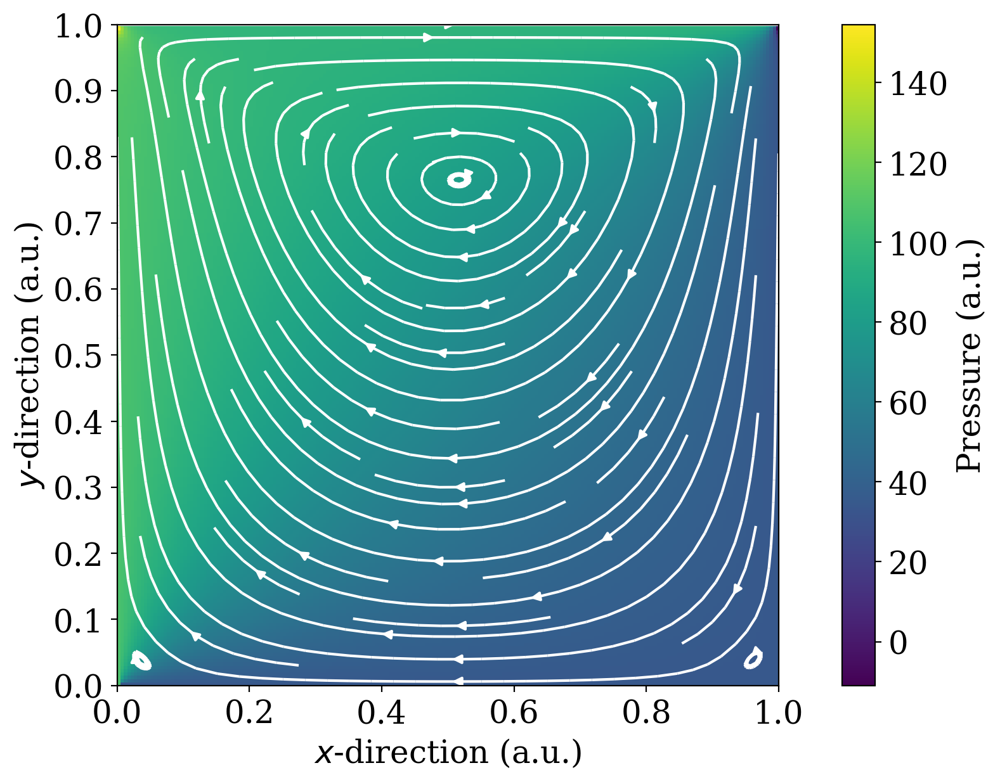

In [22]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot0_VelStream_Pres'
path_name = '{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

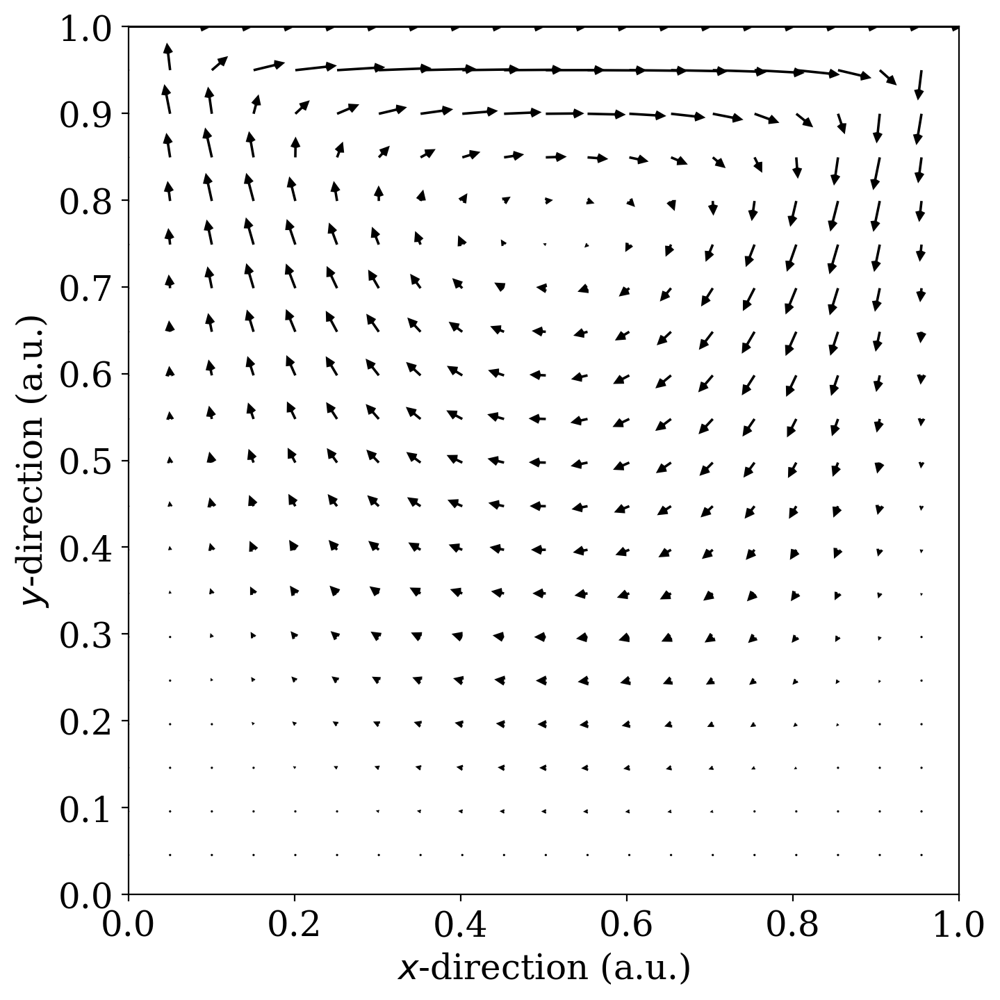

In [23]:
# Plot the velocity quiver
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot0_VelQuiver'
path_name = '{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

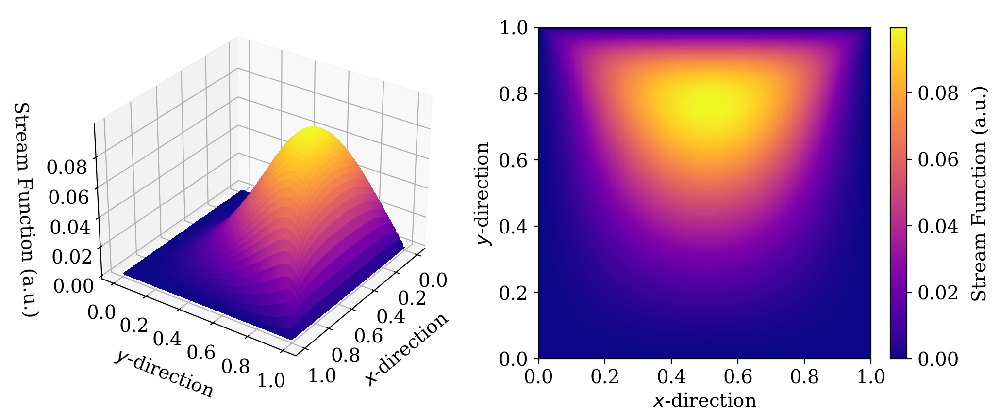

In [24]:
# Plot the stream function
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot0_StrFunc'
path_name = '{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

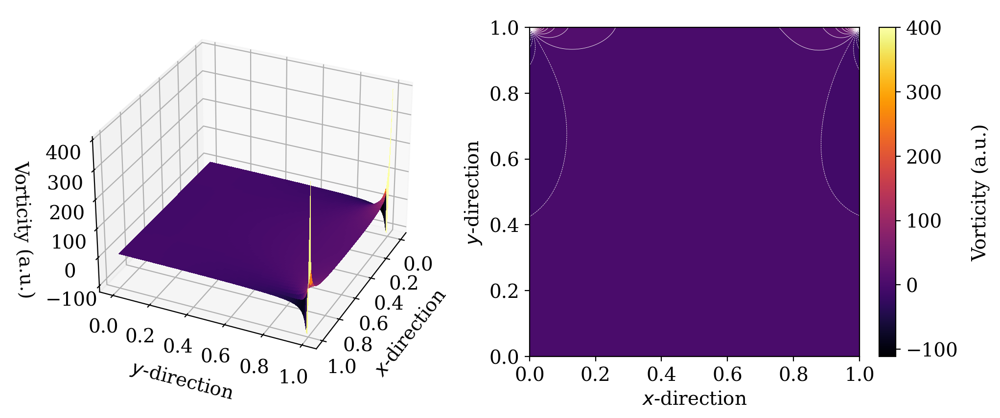

In [25]:
# Plot the vorticity
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot0_Vort'
path_name = '{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

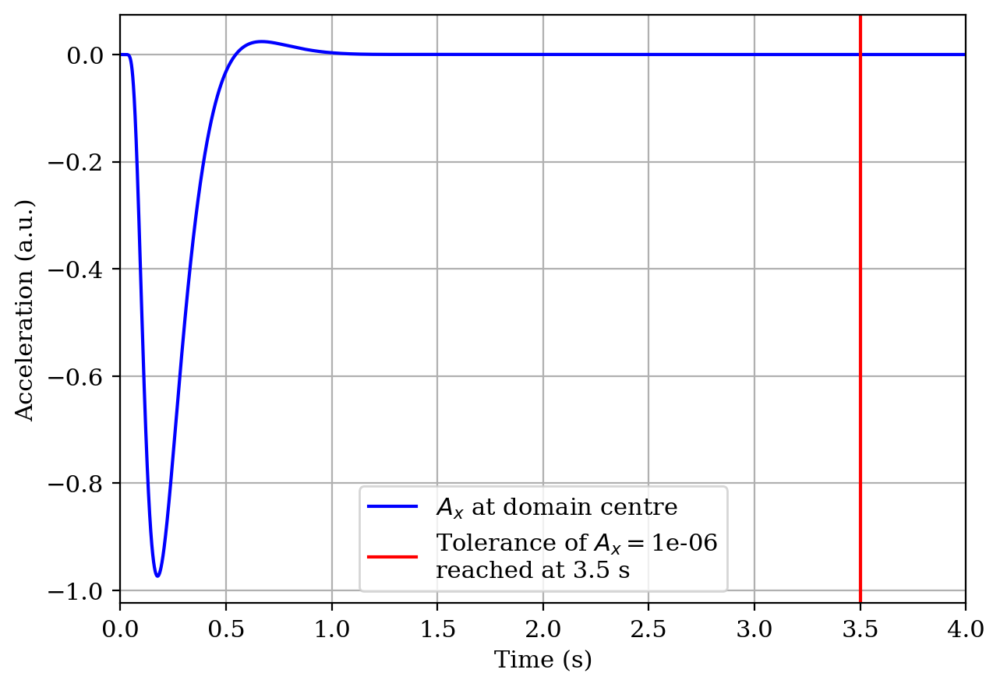

In [26]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe10_0, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot0_Accl'
path_name = '{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe10_0, tolerance, ylimits = [], xlimits=[0,4], \
                  save_fig=save_fig, save_name=path_name)

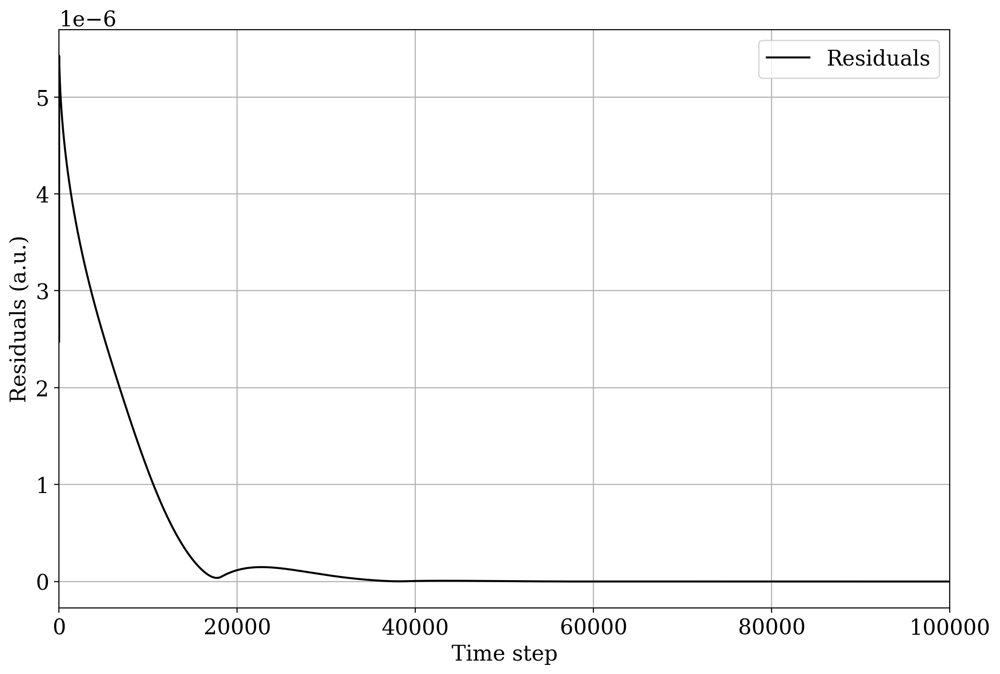

In [27]:
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot0_Residuals'
path_name = '{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

### Reynolds Number: 10
### V$_\textrm{top}$=1, V$_\textrm{bot}$=1 (both walls moving in same direction)

In [ ]:
# INITIALISATION
Re = 10

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = True  # Bottom wall moving?
Vbot = 1           # Bottom wall velocity

Nt = int(1e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 10\\Results_Re_10_Vbot1.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [28]:
# Load saved data
with open('Saved Data\\Reynolds 10\\Results_Re_10_Vbot1.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [29]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.03646
Mean of the spatial interior of w: 3.42006
Mean of the spatial interior of Vx: 0.23225
Mean of the spatial interior of Vy: 0.11339
Mean of the spatial interior of p: 81.42768


Mean of the spatial boundary of w: 19.319
Mean of the spatial boundary of p: 81.46


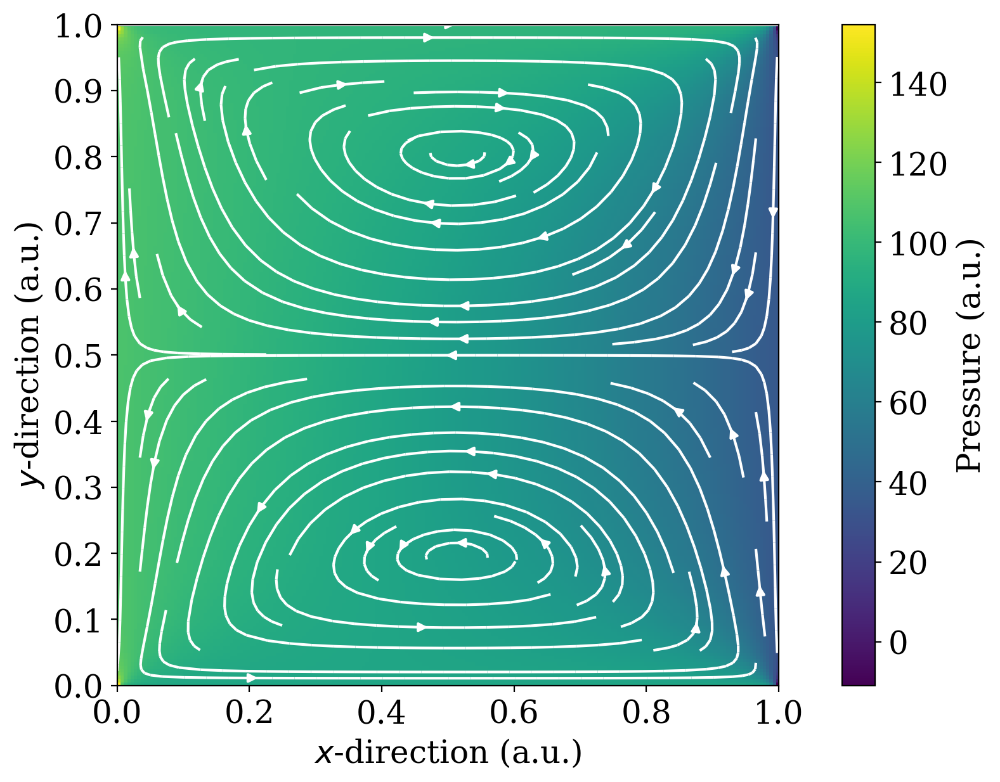

In [30]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot1_VelStream_Pres'
path_name = '{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

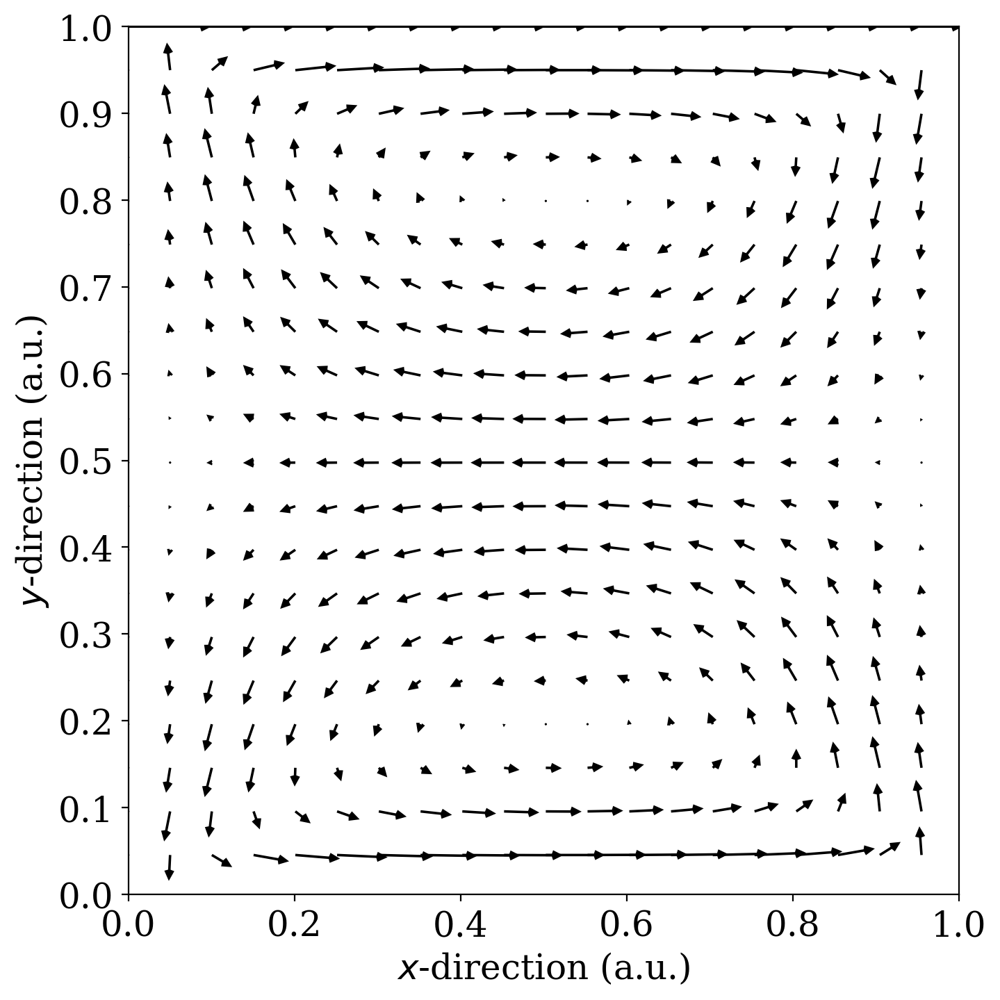

In [31]:
# Plot the velocity quiver
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot1_VelQuiver'
path_name = '{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

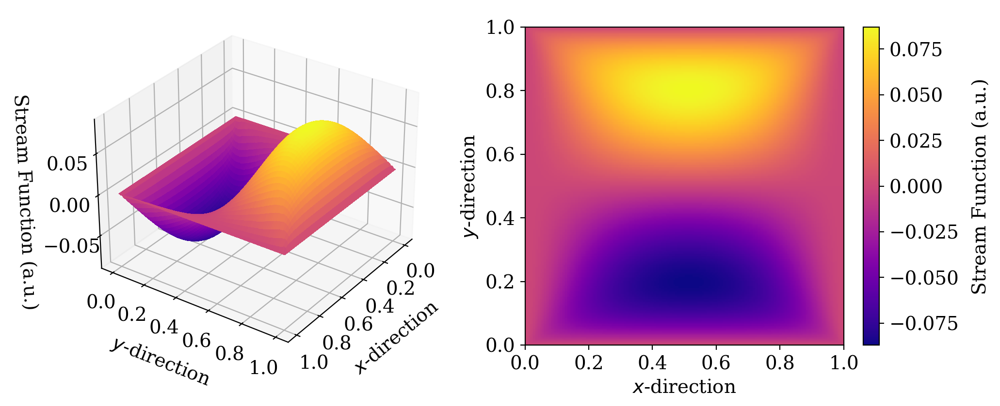

In [32]:
# Plot the stream function
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot1_StrFunc'
path_name = '{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

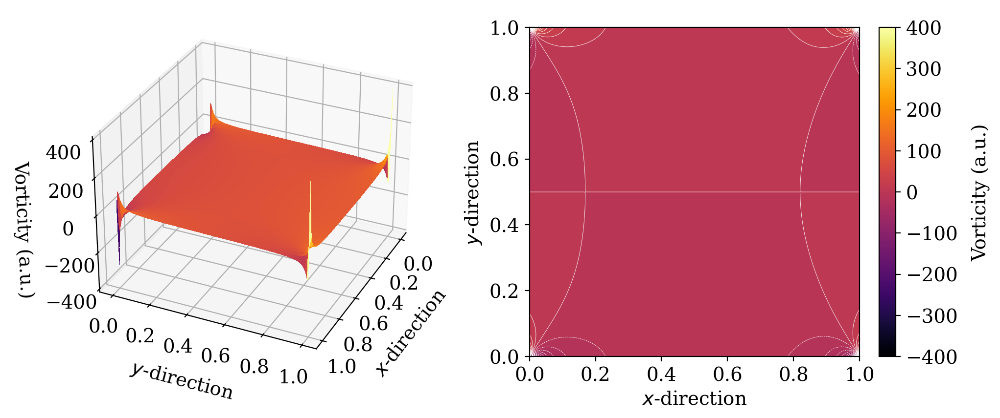

In [33]:
# Plot the vorticity
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot1_Vort'
path_name = '{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

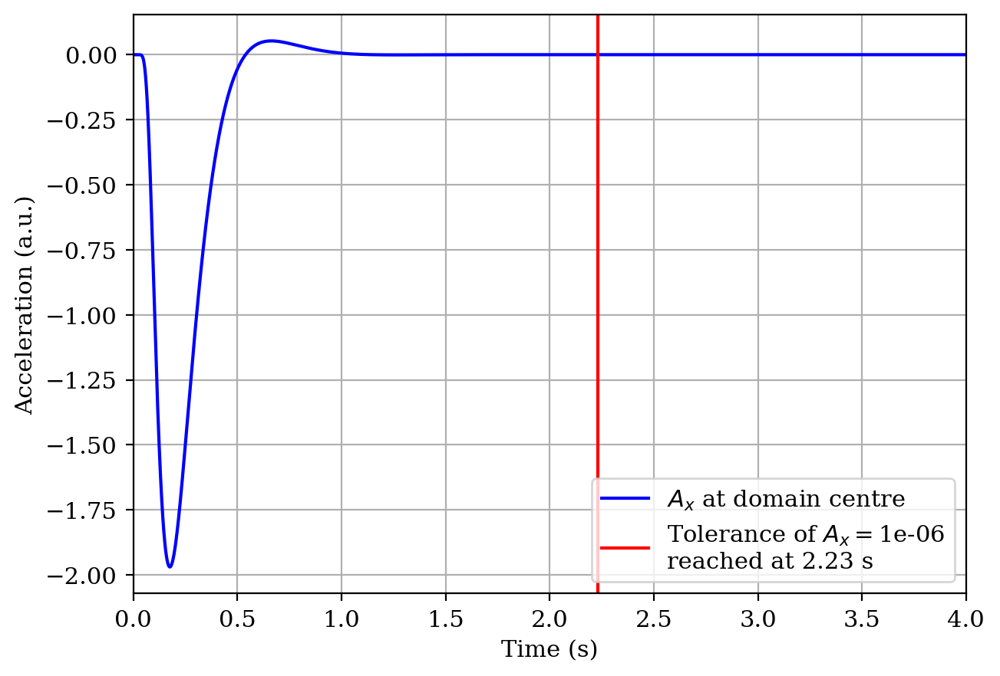

In [34]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe10_1, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot1_Accl'
path_name = 'False{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe10_1, tolerance, ylimits = [], xlimits=[0,4], \
                  save_fig=save_fig, save_name=path_name)

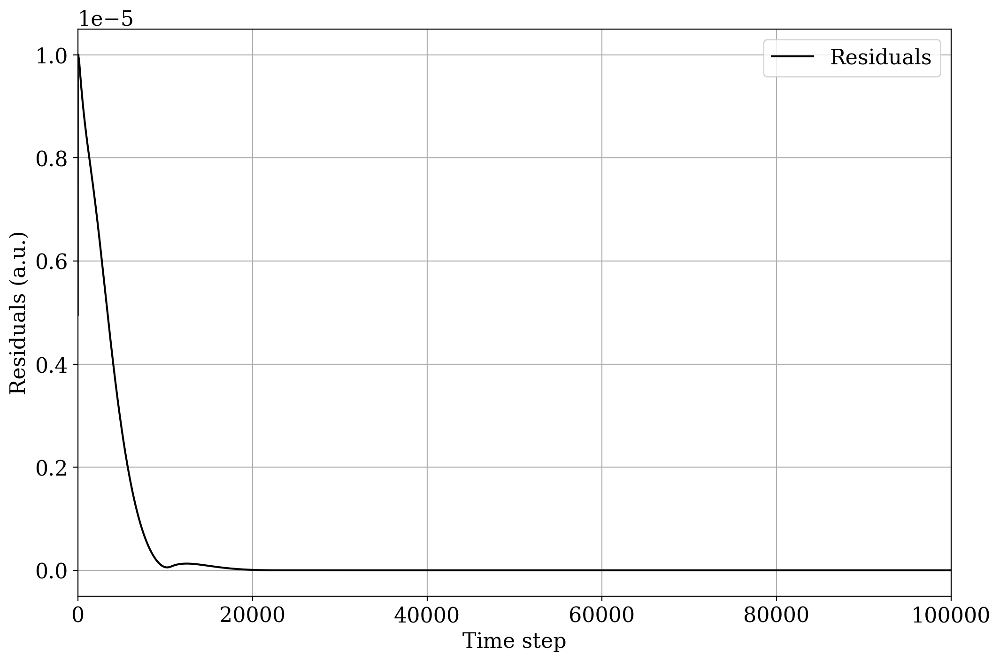

In [35]:
save_fig = False
file_name = 'Graphs\\Reynolds 10\\Re10_Vbot1_Residuals'
path_name = '{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

### Reynolds Number: 10
### V$_\textrm{top}$=1, V$_\textrm{bot}$=-1 (both walls moving, in opposite directions)

In [ ]:
# INITIALISATION
Re = 10

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = True  # Bottom wall moving?
Vbot = -1           # Bottom wall velocity

Nt = int(1e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 10\\Results_Re_10_Vbot-1.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [36]:
# Load saved data
with open('Saved Data\\Reynolds 10\\Results_Re_10_Vbot-1.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [37]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.05845
Mean of the spatial interior of w: 3.50725
Mean of the spatial interior of Vx: 0.15727
Mean of the spatial interior of Vy: 0.1982
Mean of the spatial interior of p: 56.70883


Mean of the spatial boundary of w: 19.527
Mean of the spatial boundary of p: 63.928


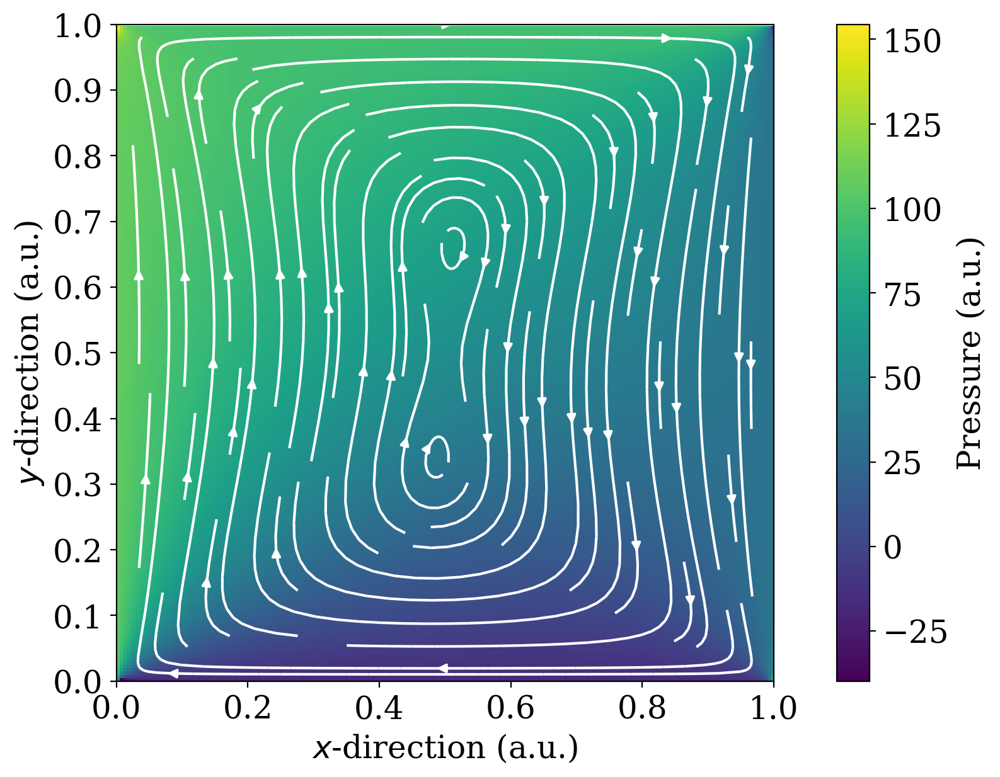

In [38]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re10_Vbot-1_VelStream_Pres'
path_name = 'Graphs\\Reynolds 10\\Vbot=-1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

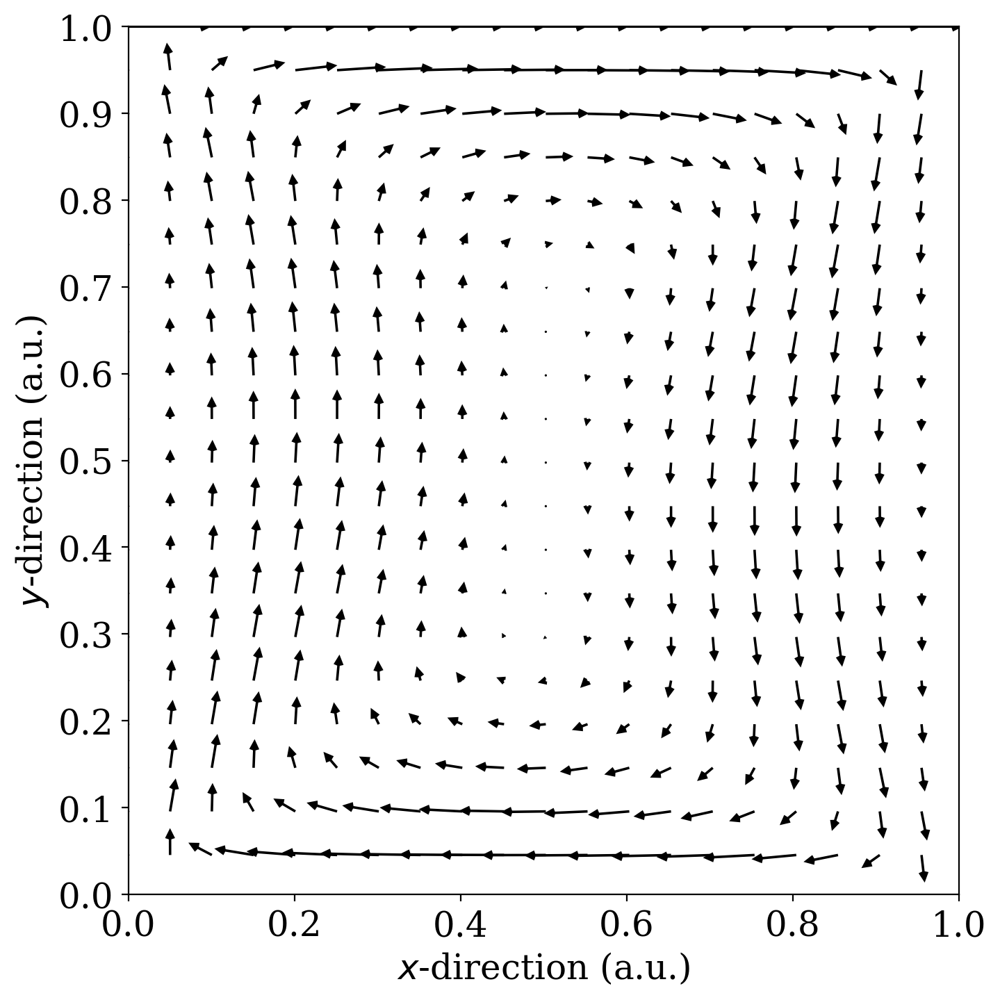

In [39]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re10_Vbot-1_VelQuiver'
path_name = 'Graphs\\Reynolds 10\\Vbot=-1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

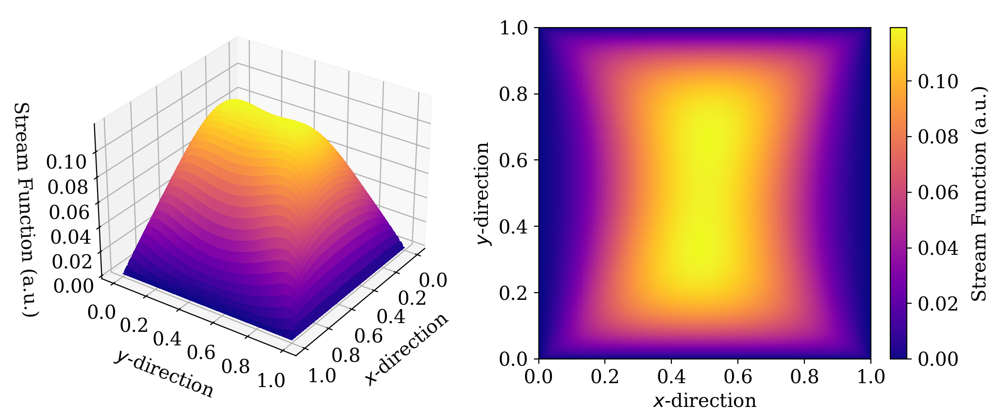

In [40]:
# Plot the stream function
save_fig = False
file_name = 'Re10_Vbot-1_StrFunc'
path_name = 'Graphs\\Reynolds 10\\Vbot=-1\\{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

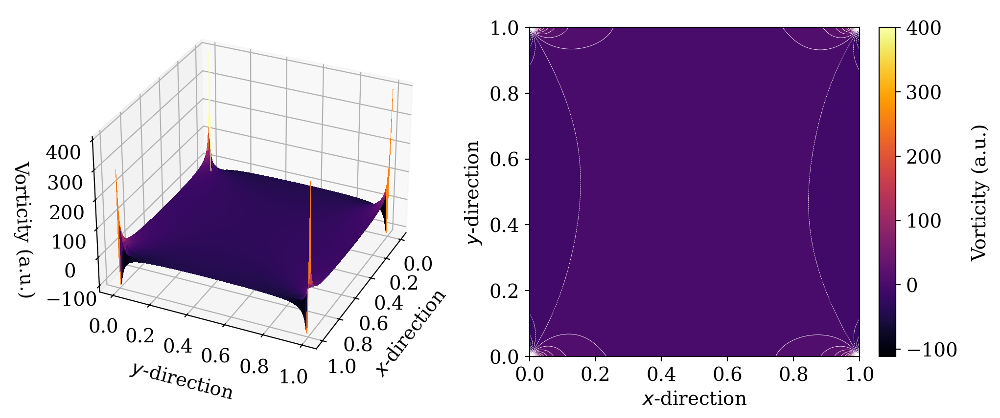

In [41]:
# Plot the vorticity
save_fig = False
file_name = 'Re10_Vbot-1_Vort'
path_name = 'Graphs\\Reynolds 10\\Vbot=-1\\{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

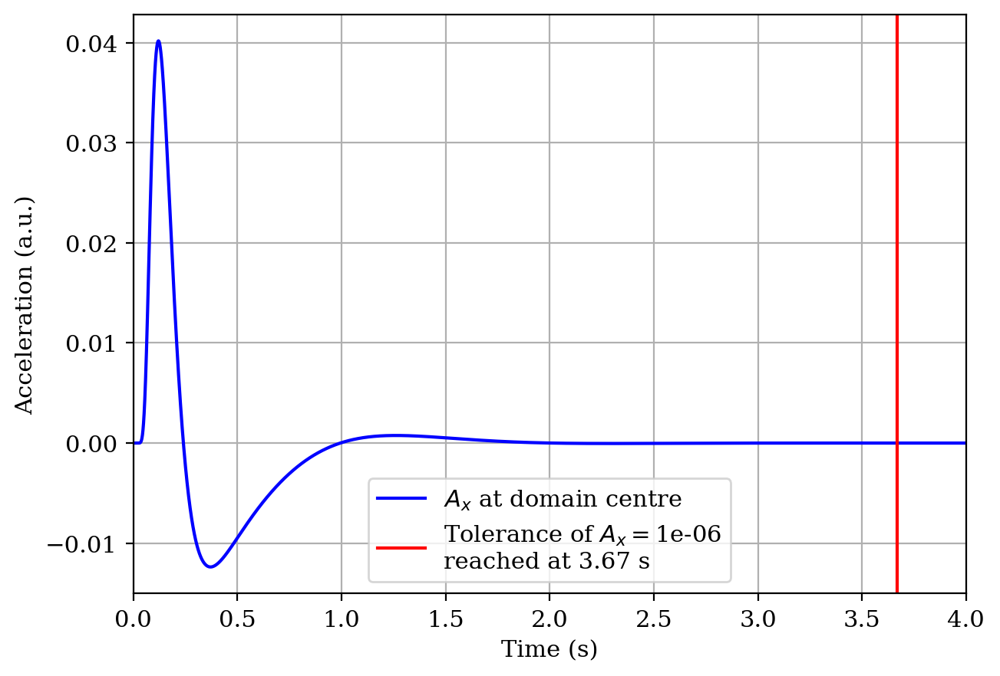

In [42]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe10_neg1, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re10_Vbot-1_Accl'
path_name = 'Graphs\\Reynolds 10\\Vbot=-1\\{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe10_neg1, tolerance, ylimits = [], xlimits=[0,4], \
                  save_fig=save_fig, save_name=path_name)

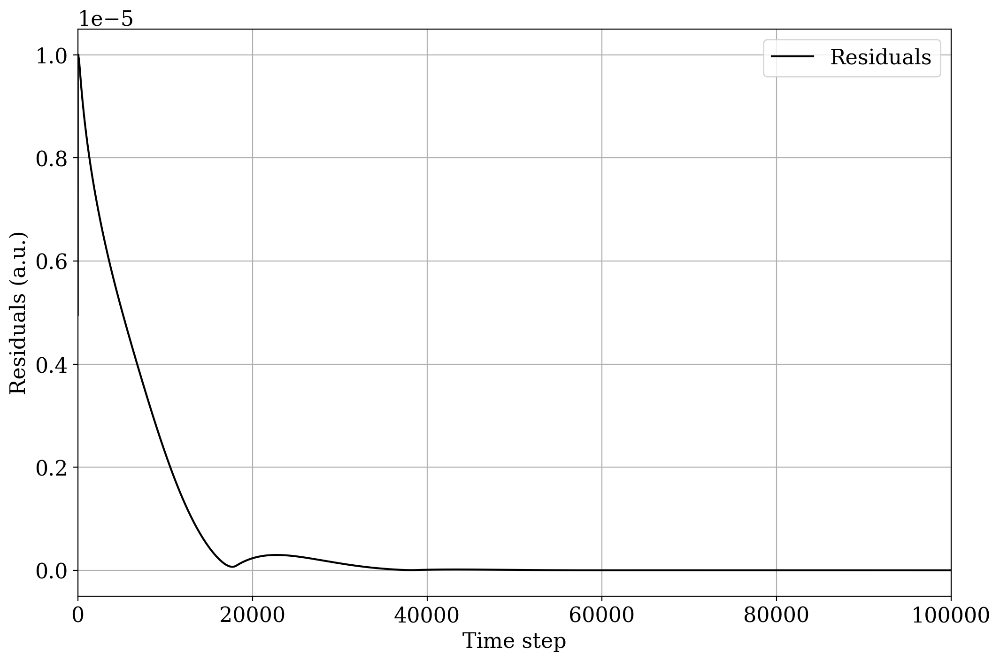

In [43]:
save_fig = False
file_name = 'Re10_Vbot-1_Residuals'
path_name = 'Graphs\\Reynolds 10\\Vbot=-1\\{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

## Reynolds Number: 100

### Reynolds Number: 100
### V$_\textrm{top}$=1, V$_\textrm{bot}$=0 (moving top wall only)

In [ ]:
# INITIALISATION
Re = 100

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = False  # Bottom wall moving?
Vbot = 0           # Bottom wall velocity

Nt = int(4e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 100\\Results_Re_100_Vbot0.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [44]:
# Load saved data
with open('Saved Data\\Reynolds 100\\Results_Re_100_Vbot0.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [45]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.03048
Mean of the spatial interior of w: 1.97698
Mean of the spatial interior of Vx: 0.1249
Mean of the spatial interior of Vy: 0.10625
Mean of the spatial interior of p: 6.57094


Mean of the spatial boundary of w: 10.982
Mean of the spatial boundary of p: 6.648


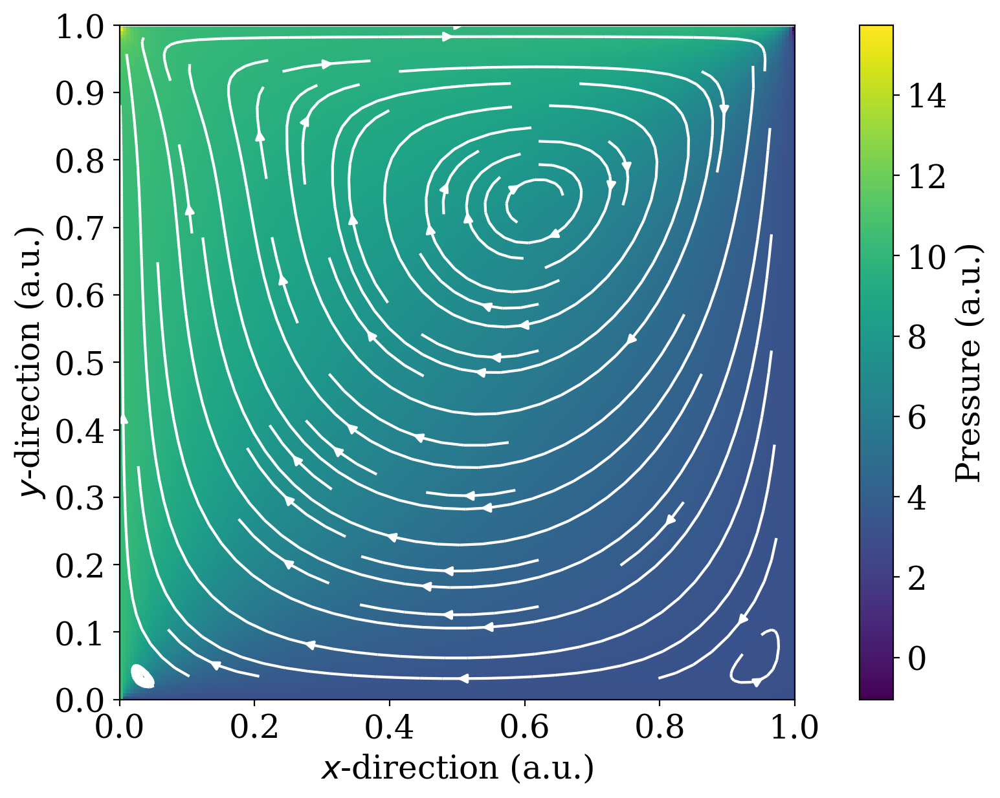

In [46]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re100_Vbot0_VelStream_Pres'
path_name = '{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

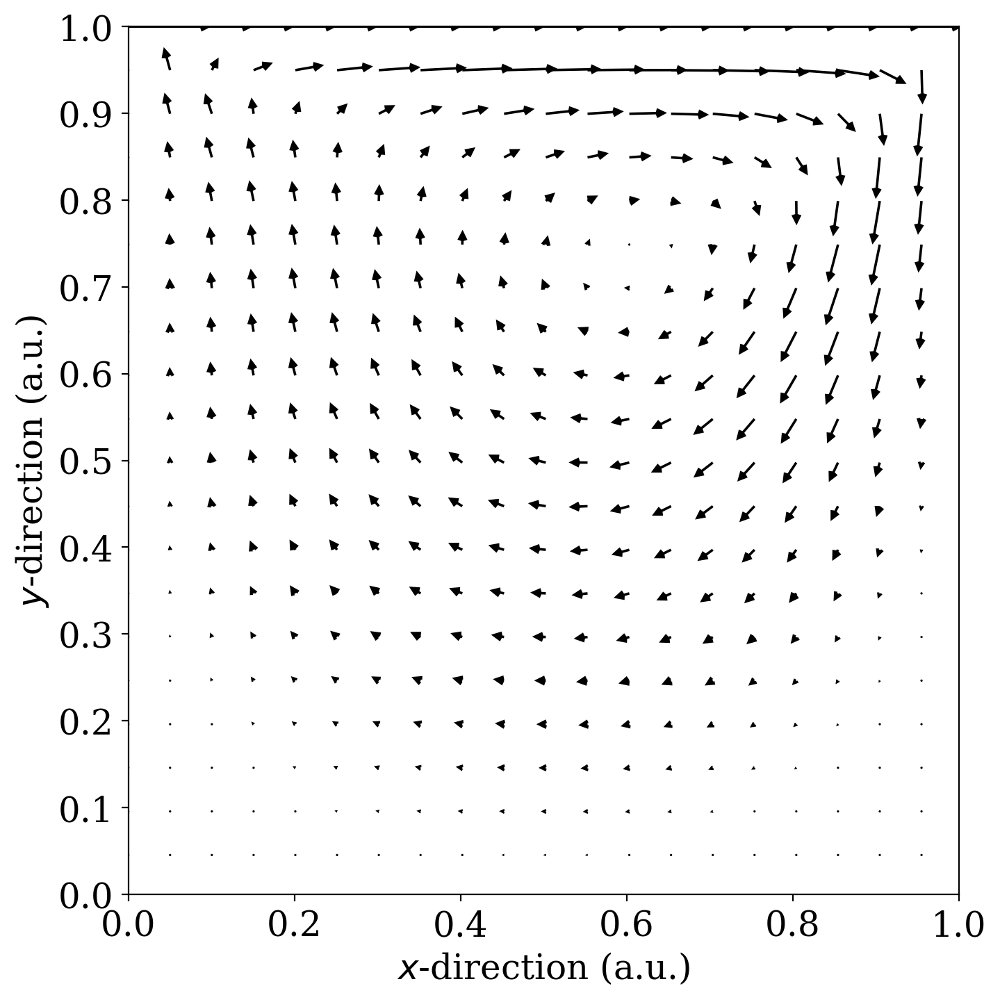

In [47]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re100_Vbot0_VelQuiver'
path_name = '{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

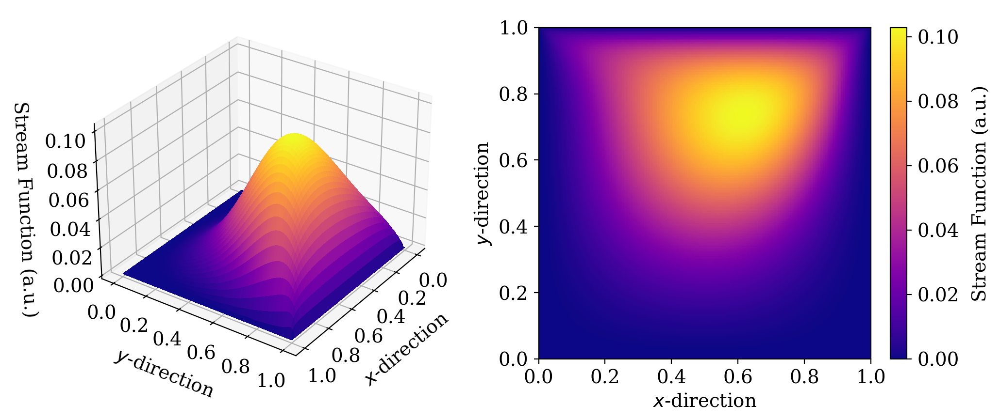

In [48]:
# Plot the stream function
save_fig = False
file_name = 'Re100_Vbot0_StrFunc'
path_name = '{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

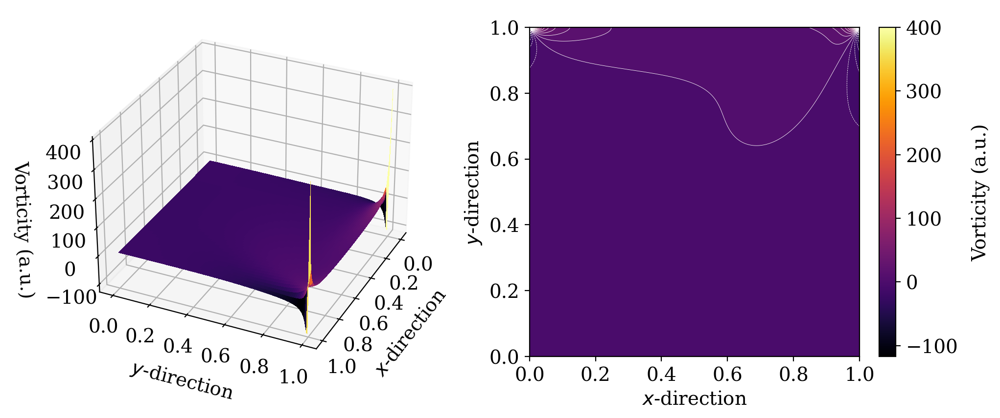

In [49]:
# Plot the vorticity
save_fig = False
file_name = 'Re100_Vbot0_Vort'
path_name = '{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

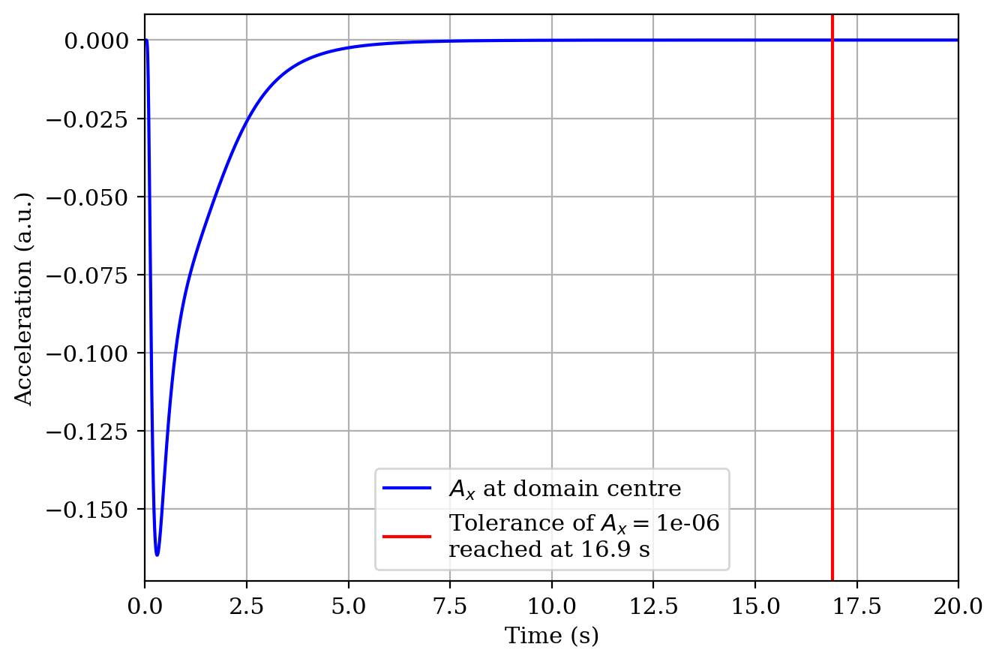

In [50]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe100_0, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re100_Vbot0_Accl'
path_name = '{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe100_0, tolerance, ylimits = [], xlimits=[0,20], \
                  save_fig=save_fig, save_name=path_name)

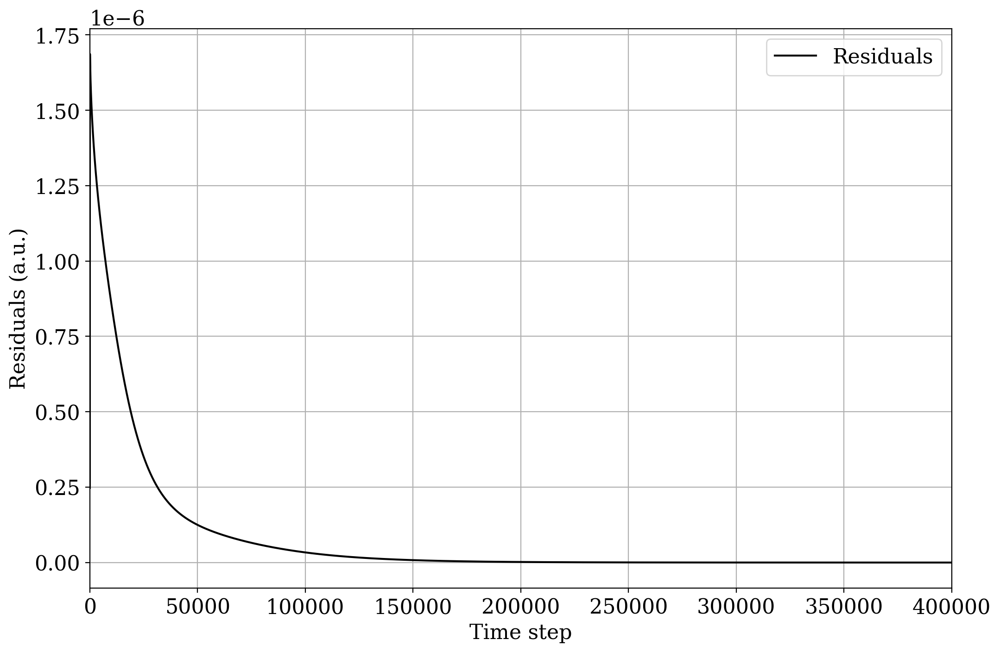

In [51]:
save_fig = False
file_name = 'Re100_Vbot0_Residuals'
path_name = '{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

### Reynolds Number: 100
### V$_\textrm{top}$=1, V$_\textrm{bot}$=1 (both walls moving in same direction)

In [ ]:
# INITIALISATION
Re = 100

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = True  # Bottom wall moving?
Vbot = 1           # Bottom wall velocity

Nt = int(5e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 100\\Results_Re_100_Vbot1.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [52]:
# Load saved data
with open('Saved Data\\Reynolds 100\\Results_Re_100_Vbot1.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [53]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.03678
Mean of the spatial interior of w: 3.49239
Mean of the spatial interior of Vx: 0.23037
Mean of the spatial interior of Vy: 0.11753
Mean of the spatial interior of p: 7.96514


Mean of the spatial boundary of w: 20.058
Mean of the spatial boundary of p: 8.108


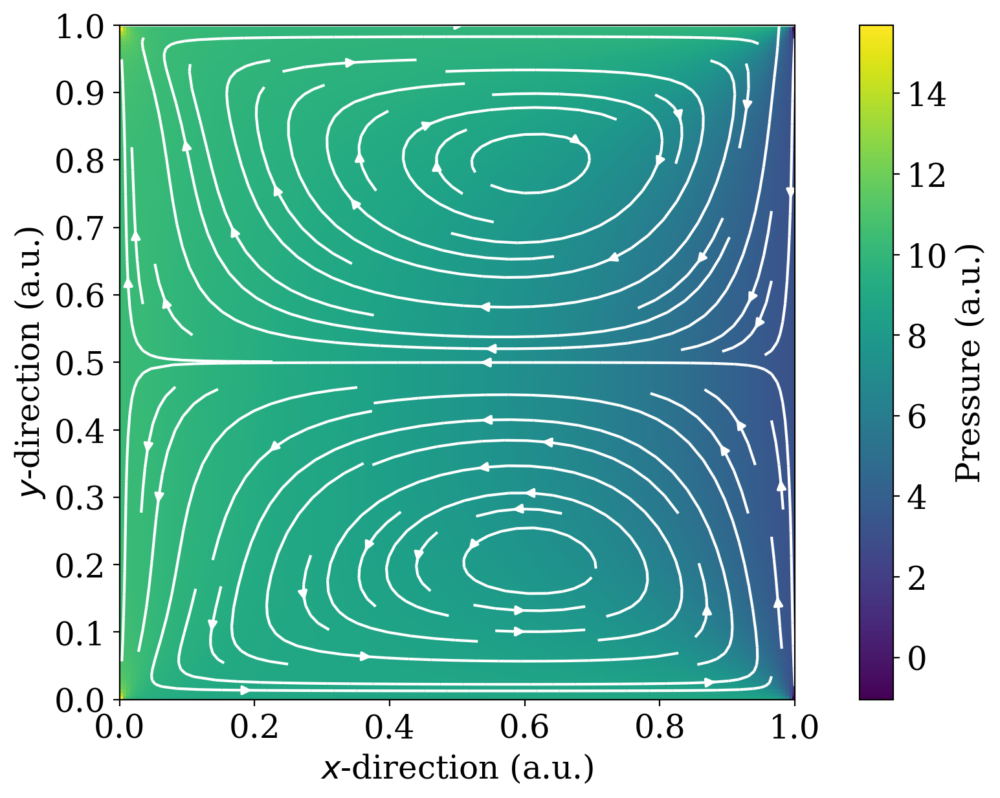

In [54]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re100_Vbot1_VelStream_Pres'
path_name = 'Graphs\\Reynolds 100\\Vbot=1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

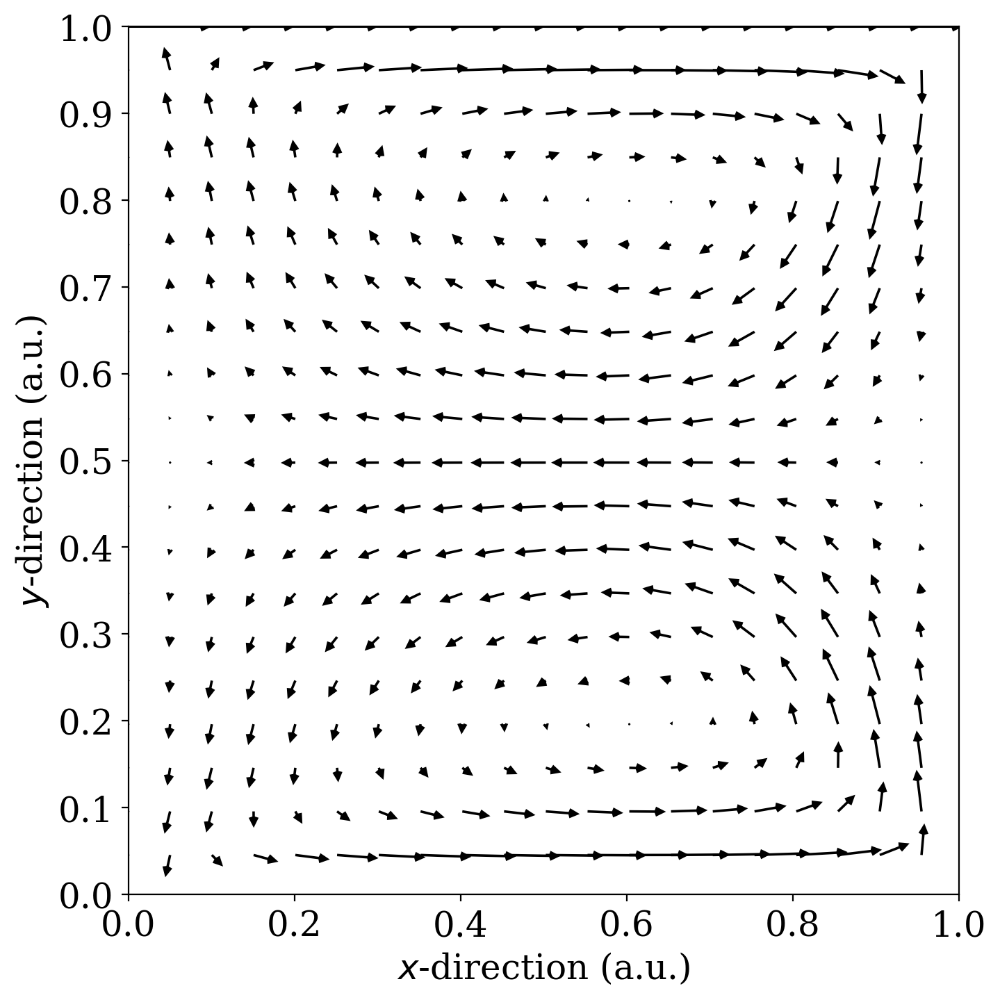

In [55]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re100_Vbot1_VelQuiver'
path_name = 'Graphs\\Reynolds 100\\Vbot=1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

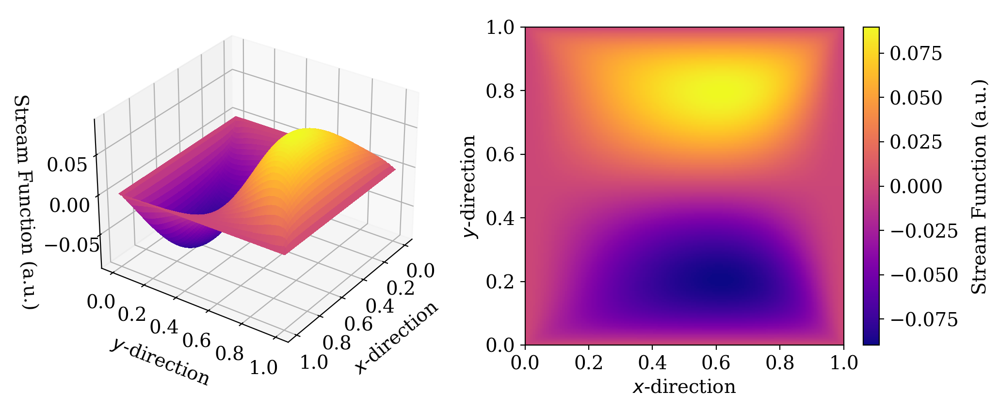

In [56]:
# Plot the stream function
save_fig = False
file_name = 'Re100_Vbot1_StrFunc'
path_name = 'Graphs\\Reynolds 100\\Vbot=1\\{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

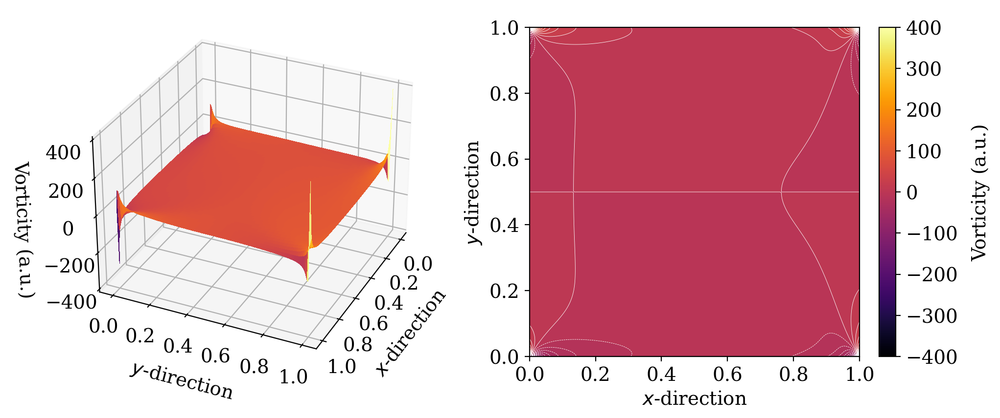

In [57]:
# Plot the vorticity
save_fig = False
file_name = 'Re100_Vbot1_Vort'
path_name = 'Graphs\\Reynolds 100\\Vbot=1\\{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

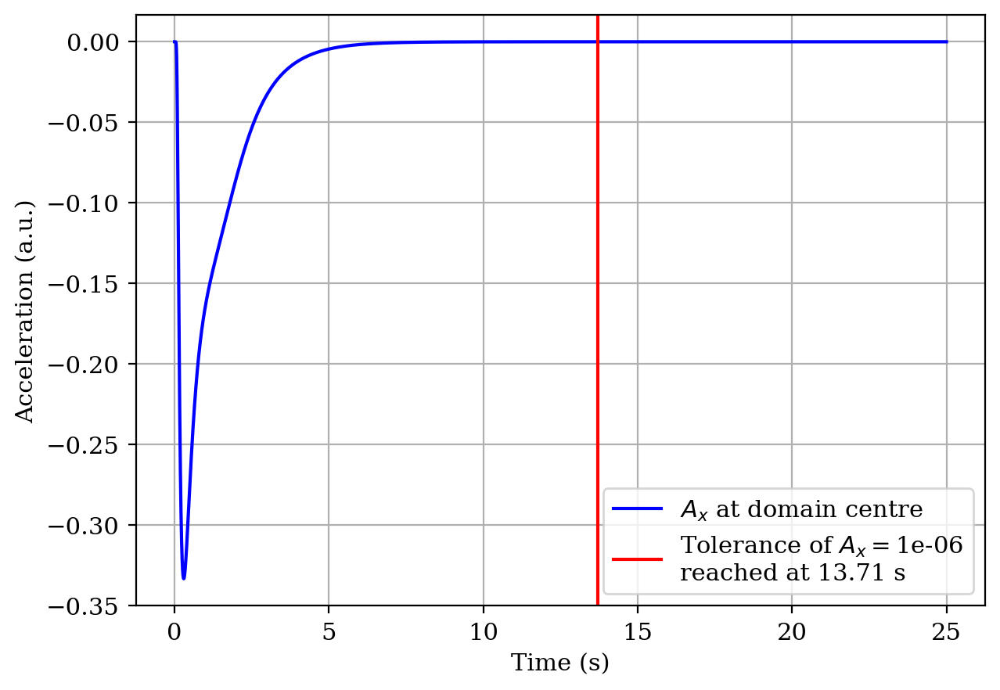

In [58]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe100_1, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re100_Vbot1_Accl'
path_name = 'Graphs\\Reynolds 100\\Vbot=1\\{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe100_1, tolerance, ylimits = [], xlimits=[], \
                  save_fig=save_fig, save_name=path_name)

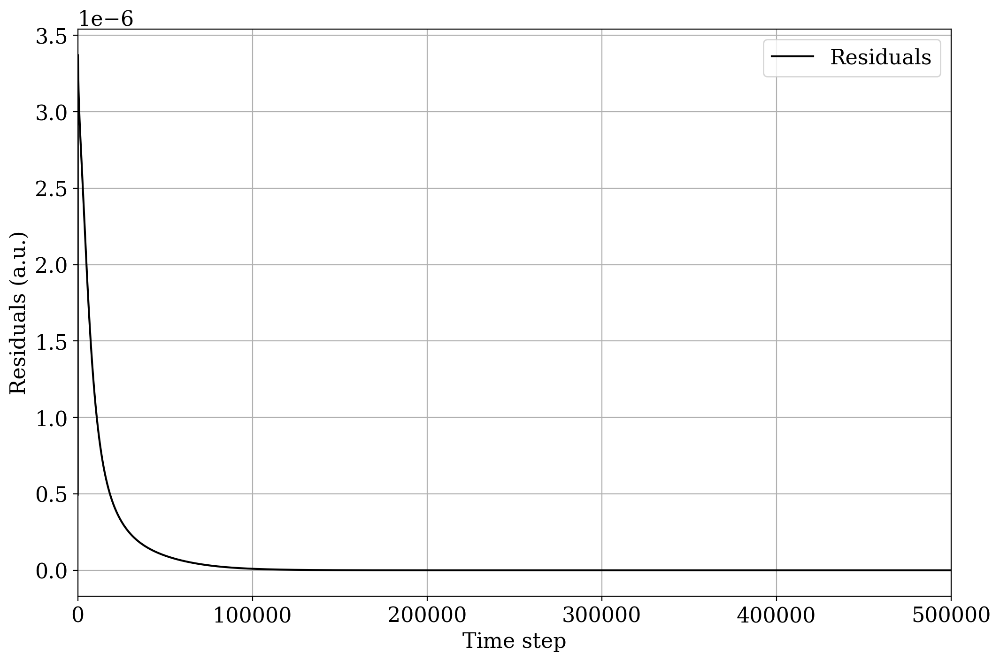

In [59]:
save_fig = False
file_name = 'Re100_Vbot1_Residuals'
path_name = 'Graphs\\Reynolds 100\\Vbot=1\\{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

### Reynolds Number: 100
### V$_\textrm{top}$=1, V$_\textrm{bot}$=-1 (both walls moving, in opposite directions)

In [ ]:
# INITIALISATION
Re = 100

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = True  # Bottom wall moving?
Vbot = -1           # Bottom wall velocity

Nt = int(5e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 100\\Results_Re_100_Vbot-1.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [60]:
# Load saved data
with open('Saved Data\\Reynolds 100\\Results_Re_100_Vbot-1.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [61]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.0619
Mean of the spatial interior of w: 3.68645
Mean of the spatial interior of Vx: 0.17857
Mean of the spatial interior of Vy: 0.20614
Mean of the spatial interior of p: 5.49729


Mean of the spatial boundary of w: 21.051
Mean of the spatial boundary of p: 6.214


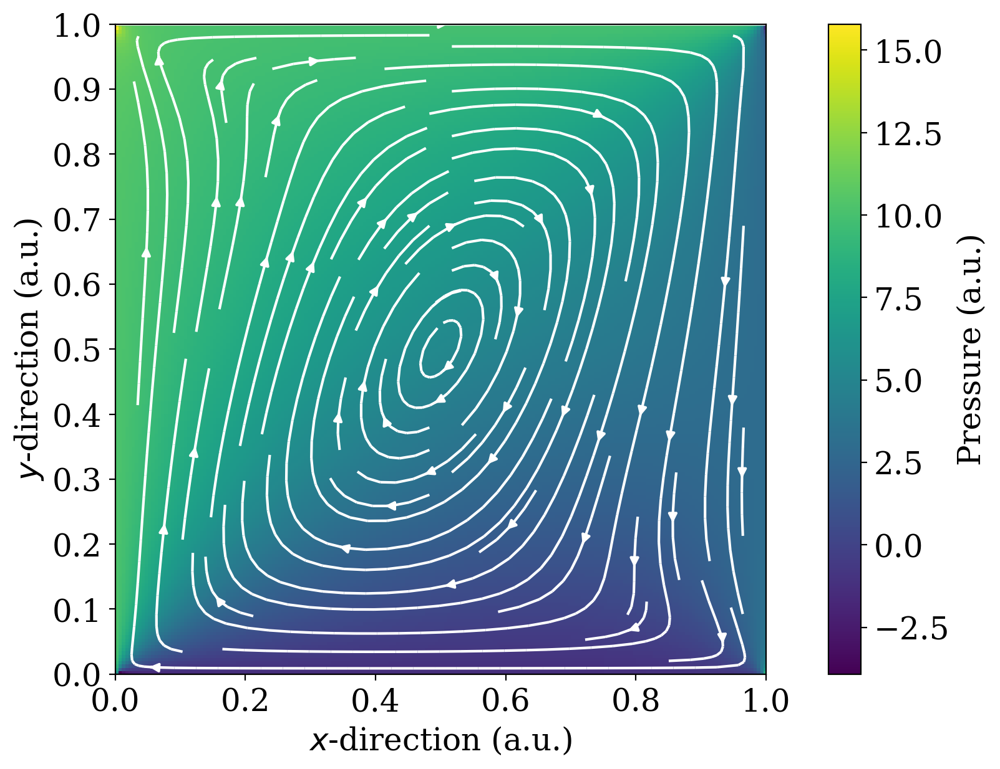

In [62]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re100_Vbot-1_VelStream_Pres'
path_name = 'Graphs\\Reynolds 100\\Vbot=-1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

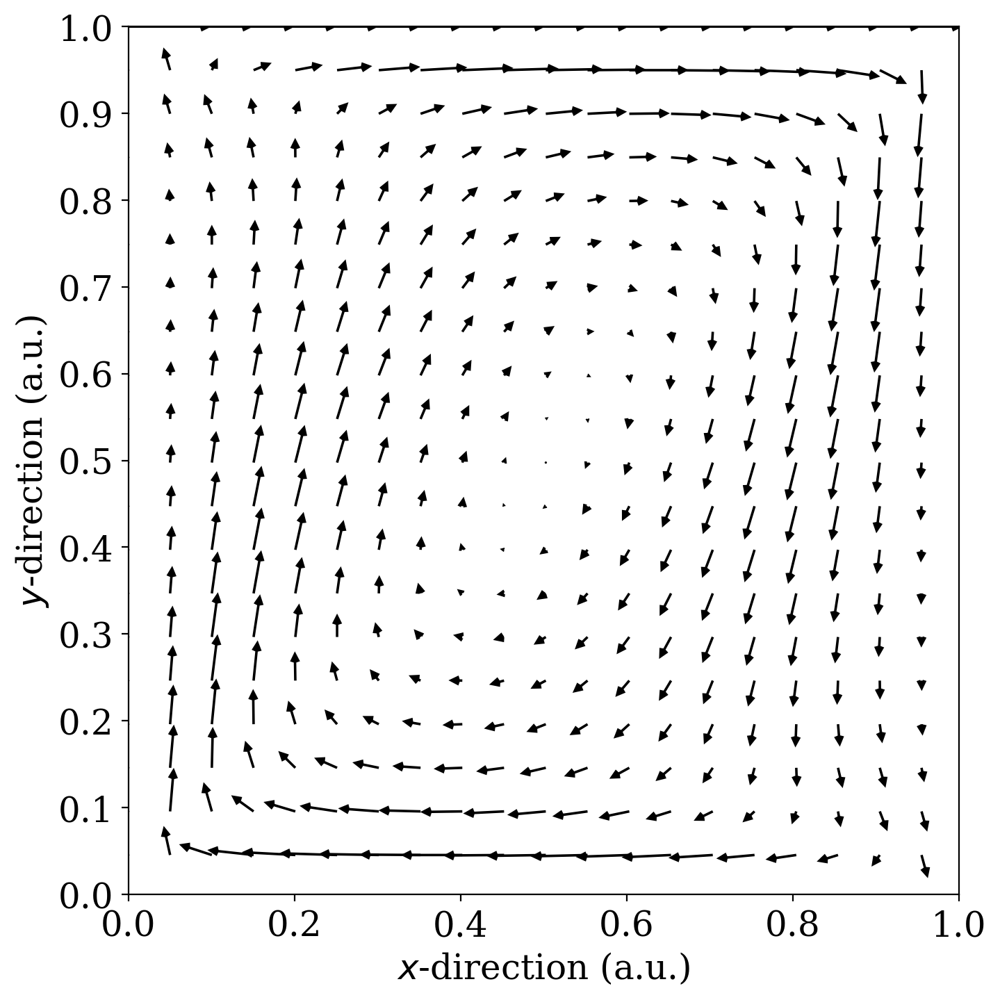

In [63]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re100_Vbot-1_VelQuiver'
path_name = 'Graphs\\Reynolds 100\\Vbot=-1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

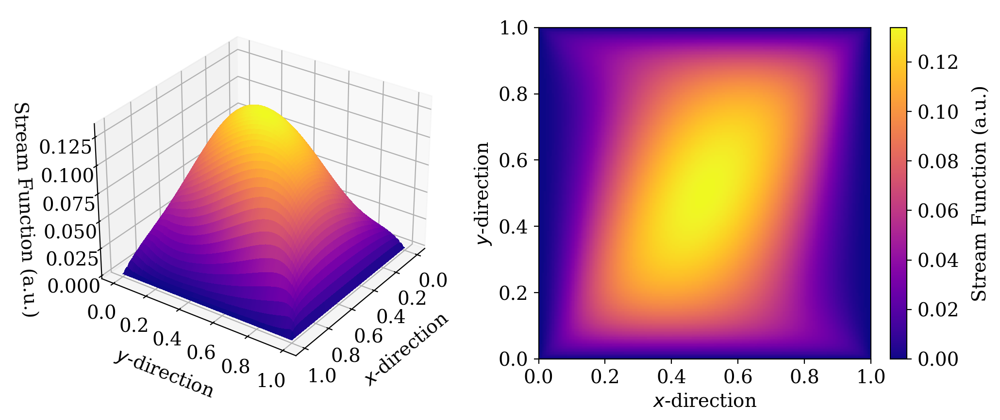

In [64]:
# Plot the stream function
save_fig = False
file_name = 'Re100_Vbot-1_StrFunc'
path_name = 'Graphs\\Reynolds 100\\Vbot=-1\\{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

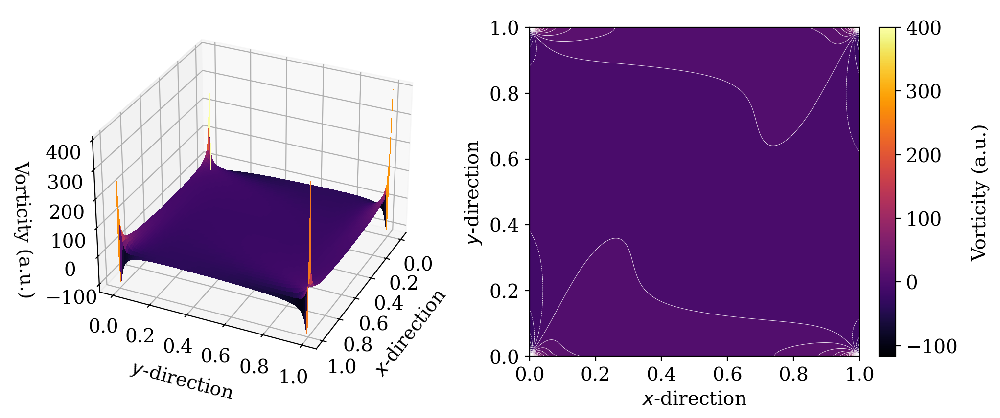

In [65]:
# Plot the vorticity
save_fig = False
file_name = 'Re100_Vbot-1_Vort'
path_name = 'Graphs\\Reynolds 100\\Vbot=-1\\{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

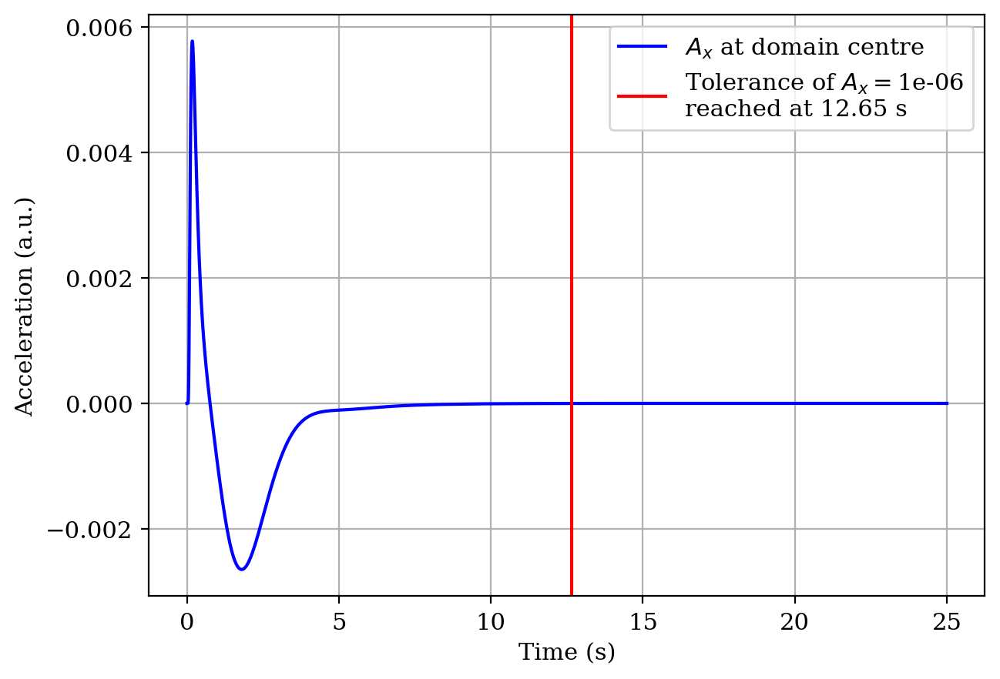

In [66]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe100_neg1, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re100_Vbot-1_Accl'
path_name = 'Graphs\\Reynolds 100\\Vbot=-1\\{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe100_neg1, tolerance, ylimits = [], xlimits=[], \
                  save_fig=save_fig, save_name=path_name)

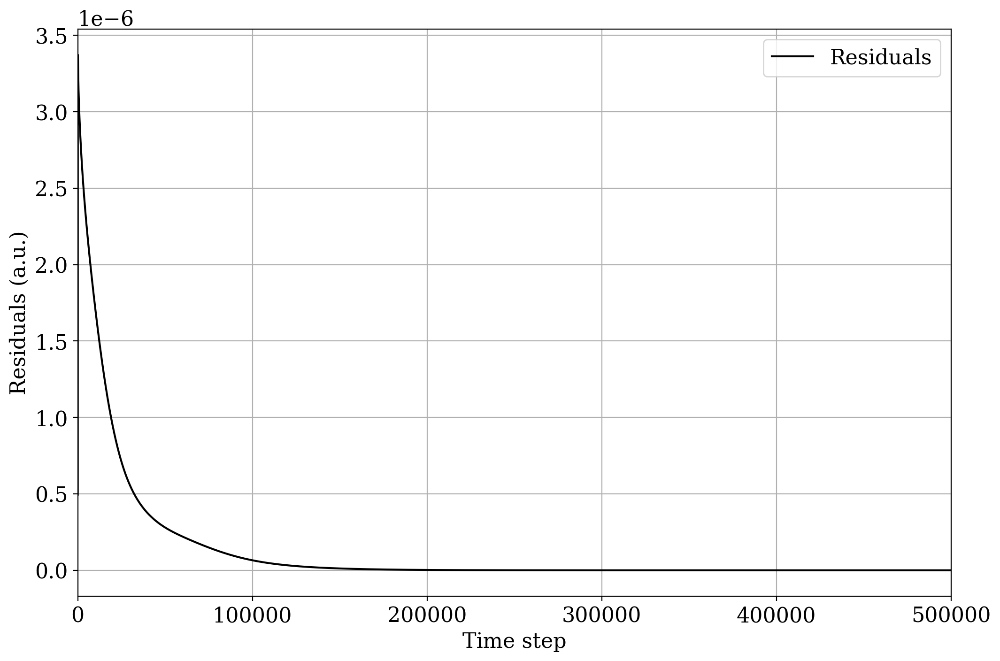

In [67]:
save_fig = False
file_name = 'Re100_Vbot-1_Residuals'
path_name = 'Graphs\\Reynolds 100\\Vbot=-1\\{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

## Reynolds Number: 200

### Reynolds Number: 200
### V$_\textrm{top}$=1, V$_\textrm{bot}$=0 (moving top wall only)

In [ ]:
# INITIALISATION
Re = 200

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = False  # Bottom wall moving?
Vbot = 0           # Bottom wall velocity

Nt = int(9e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 200\\Results_Re_200_Vbot0.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [69]:
# Load saved data
with open('Saved Data\\Reynolds 200\\Results_Re_200_Vbot0.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [70]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.03435
Mean of the spatial interior of w: 2.16146
Mean of the spatial interior of Vx: 0.12976
Mean of the spatial interior of Vy: 0.12057
Mean of the spatial interior of p: 3.19196


Mean of the spatial boundary of w: 11.932
Mean of the spatial boundary of p: 3.277


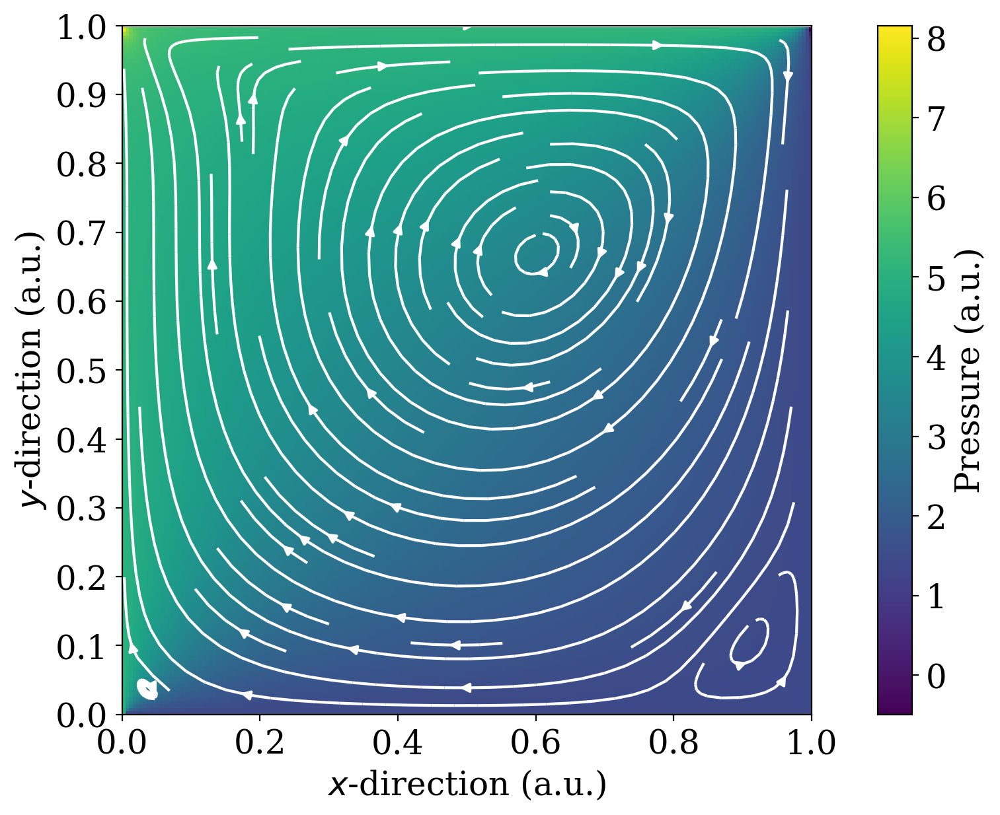

In [71]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re200_Vbot0_VelStream_Pres'
path_name = 'Graphs\\Reynolds 200\\Vbot=0\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

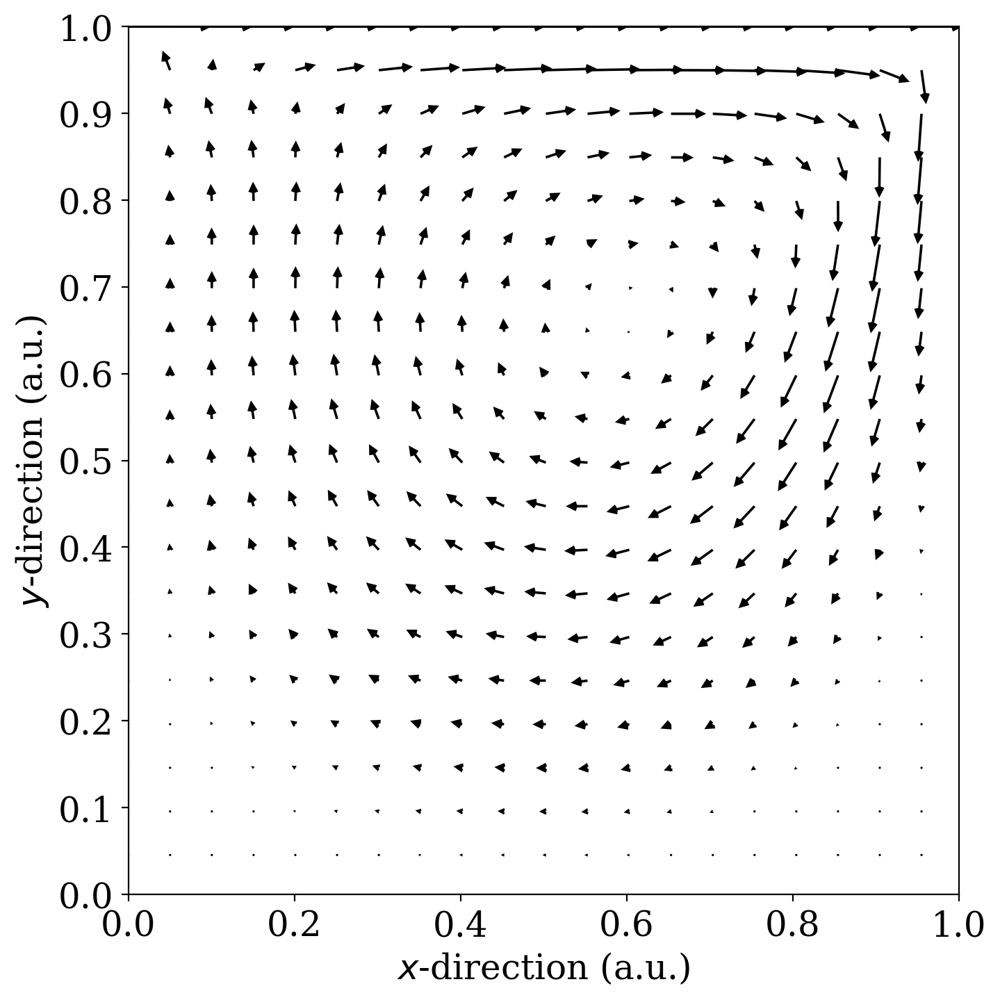

In [72]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re200_Vbot0_VelQuiver'
path_name = 'Graphs\\Reynolds 200\\Vbot=0\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

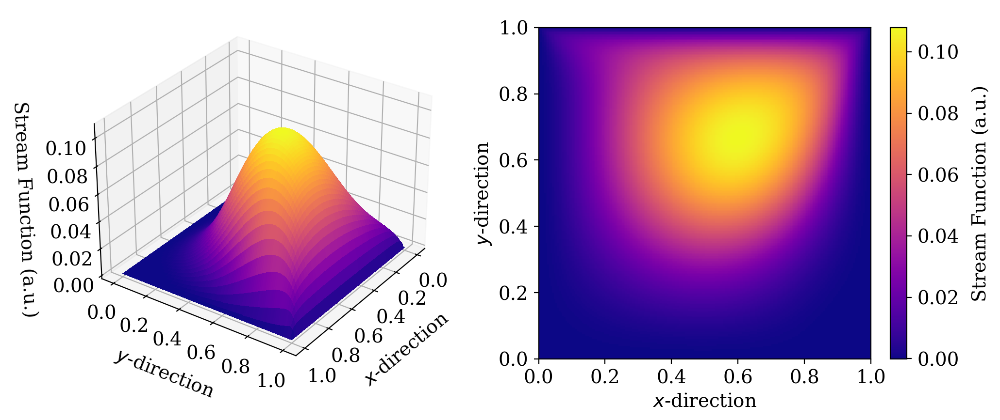

In [73]:
# Plot the stream function
save_fig = False
file_name = 'Re200_Vbot0_StrFunc'
path_name = 'Graphs\\Reynolds 200\\Vbot=0\\{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

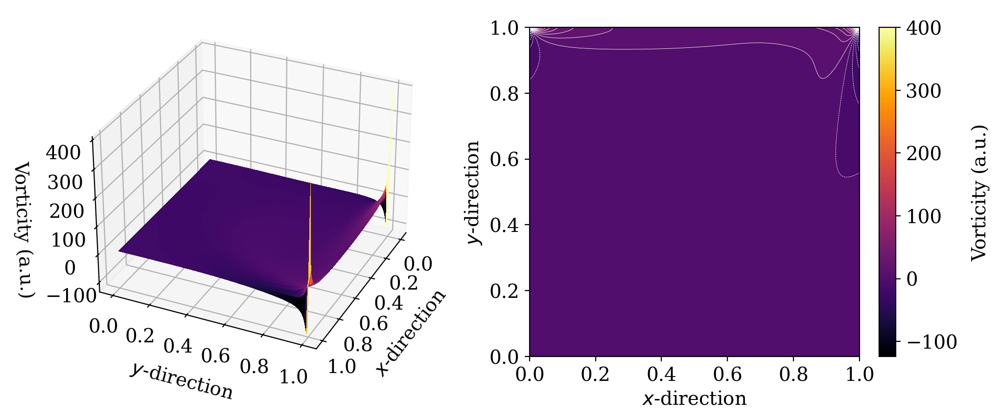

In [74]:
# Plot the vorticity
save_fig = False
file_name = 'Re200_Vbot0_Vort'
path_name = 'Graphs\\Reynolds 200\\Vbot=0\\{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

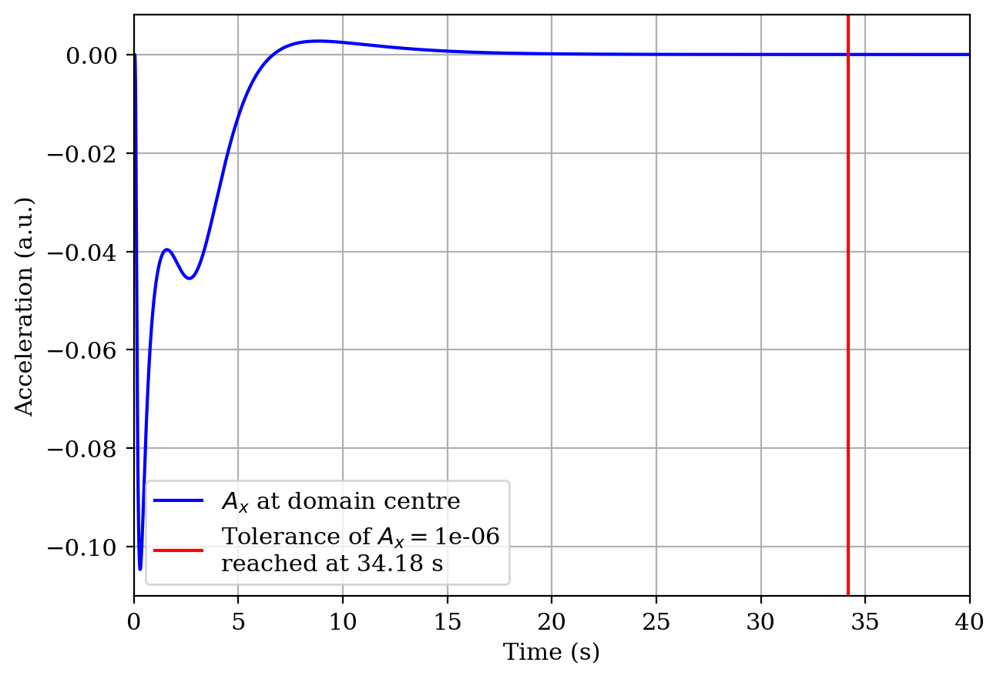

In [75]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe200_0, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re200_Vbot0_Accl'
path_name = 'Graphs\\Reynolds 200\\Vbot=0\\{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe200_0, tolerance, ylimits = [], xlimits=[0,40], \
                  save_fig=save_fig, save_name=path_name)

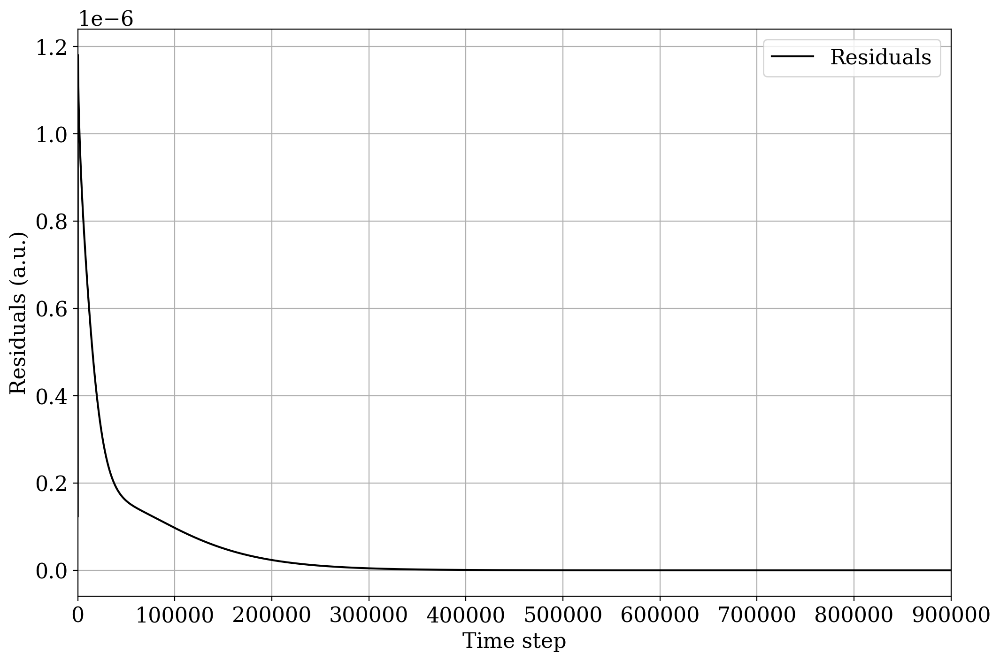

In [76]:
save_fig = False
file_name = 'Re200_Vbot0_Residuals'
path_name = 'Graphs\\Reynolds 200\\Vbot=0\\{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

### Reynolds Number: 200
### V$_\textrm{top}$=1, V$_\textrm{bot}$=1 (both walls moving in same direction)

In [ ]:
# INITIALISATION
Re = 200

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = True  # Bottom wall moving?
Vbot = 1           # Bottom wall velocity

Nt = int(9e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = False

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 200\\Results_Re_200_Vbot1.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [77]:
# Load saved data
with open('Saved Data\\Reynolds 200\\Results_Re_200_Vbot1.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [78]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.03863
Mean of the spatial interior of w: 3.6537
Mean of the spatial interior of Vx: 0.2351
Mean of the spatial interior of Vy: 0.1251
Mean of the spatial interior of p: 3.92748


Mean of the spatial boundary of w: 21.355
Mean of the spatial boundary of p: 4.095


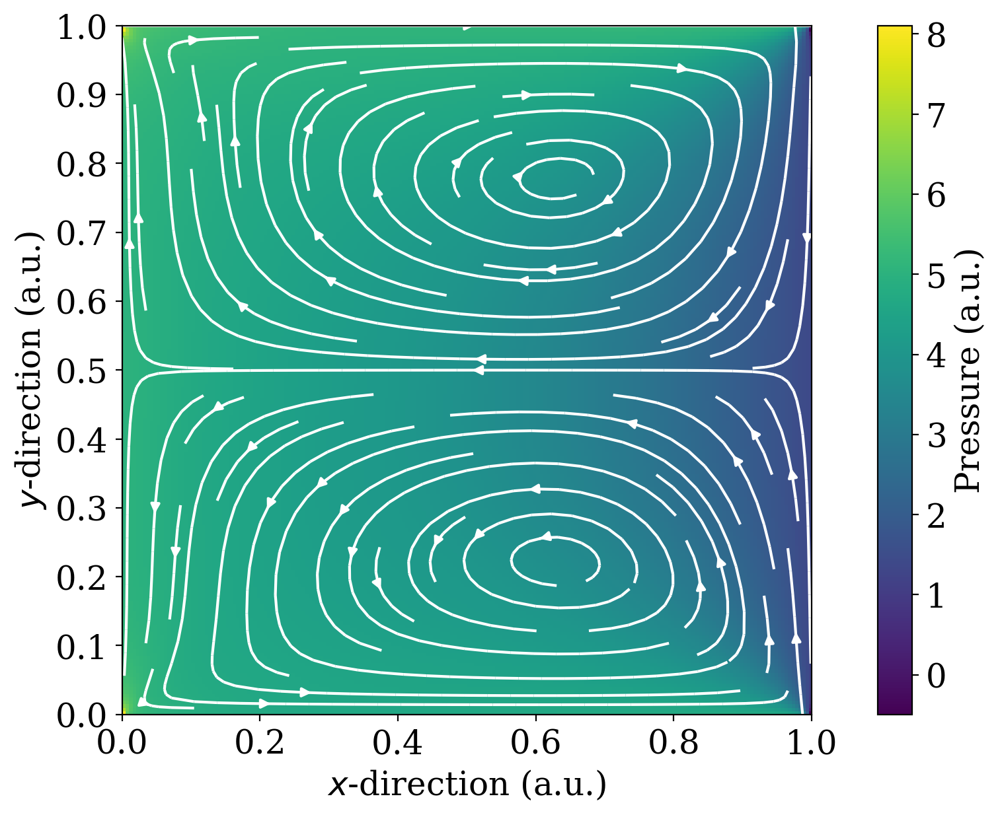

In [79]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re200_Vbot1_VelStream_Pres'
path_name = 'Graphs\\Reynolds 200\\Vbot=1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

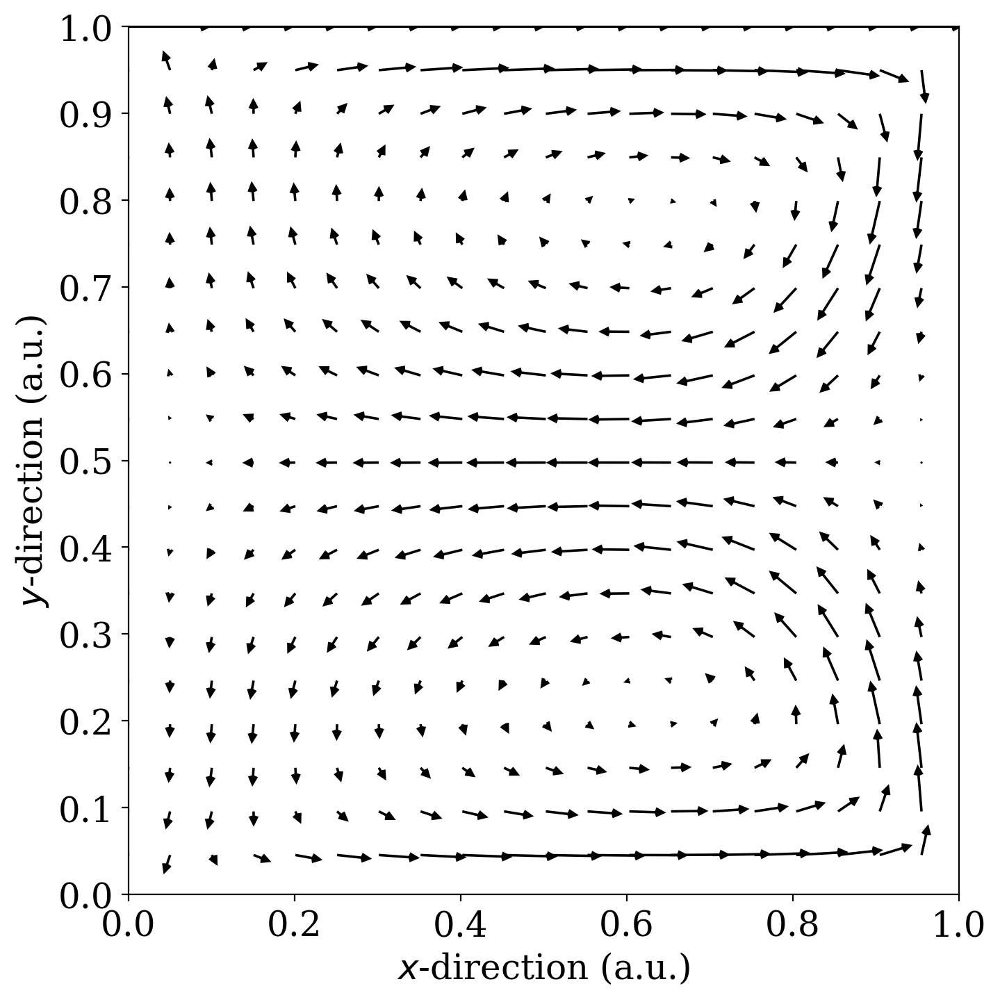

In [80]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re200_Vbot1_VelQuiver'
path_name = 'Graphs\\Reynolds 200\\Vbot=1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

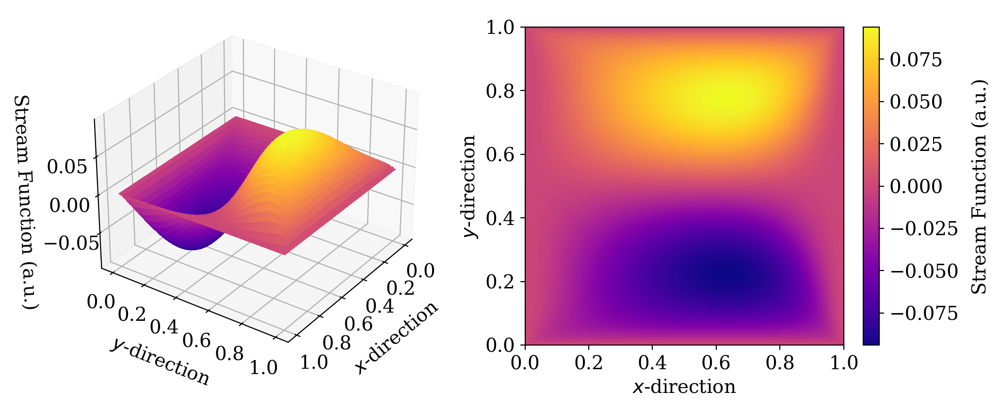

In [81]:
# Plot the stream function
save_fig = False
file_name = 'Re200_Vbot1_StrFunc'
path_name = 'Graphs\\Reynolds 200\\Vbot=1\\{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

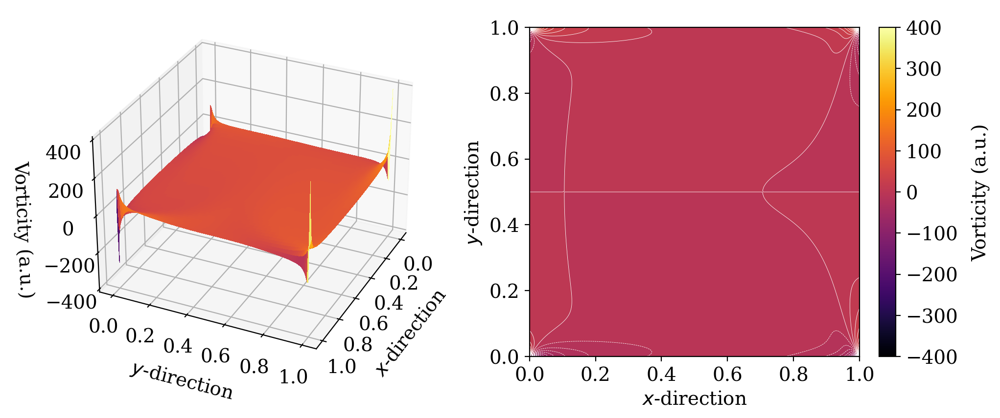

In [82]:
# Plot the vorticity
save_fig = False
file_name = 'Re200_Vbot1_Vort'
path_name = 'Graphs\\Reynolds 200\\Vbot=1\\{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

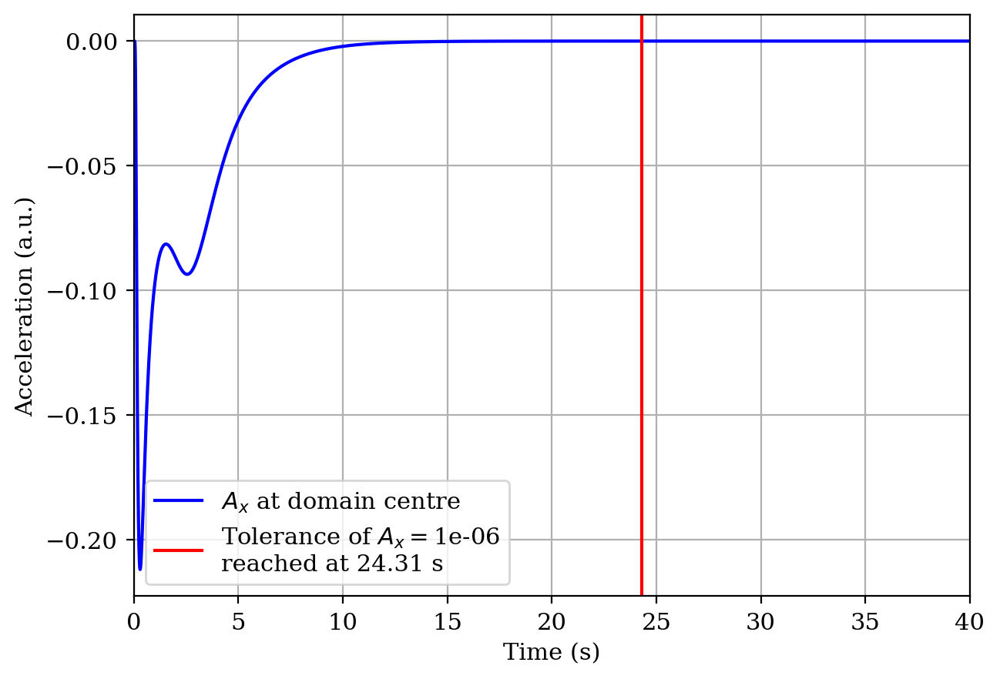

In [83]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe200_1, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re200_Vbot1_Accl'
path_name = 'Graphs\\Reynolds 200\\Vbot=1\\{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe200_1, tolerance, ylimits = [], xlimits=[0,40], \
                  save_fig=save_fig, save_name=path_name)

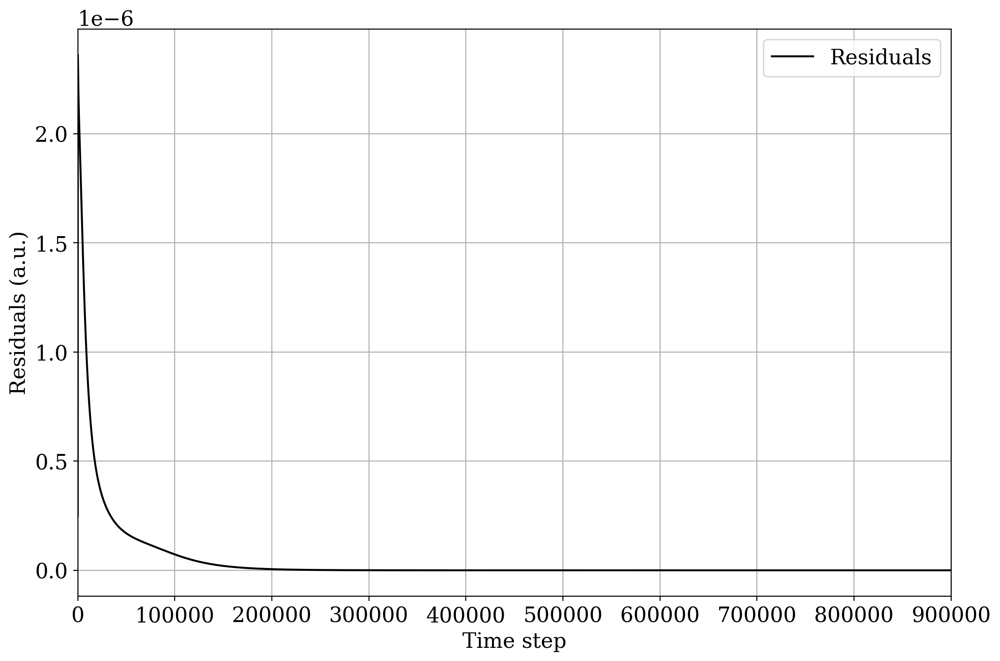

In [84]:
save_fig = False
file_name = 'Re200_Vbot1_Residuals'
path_name = 'Graphs\\Reynolds 200\\Vbot=1\\{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

### Reynolds number: 200
### V$_\textrm{top}$=1, V$_\textrm{bot}$=-1 (both walls moving, in opposite directions)

In [ ]:
# INITIALISATION
Re = 200

N = 200 # Grid number in one direction
l = 1   # Domain length (a.u.)

Vtop = 1           # Top wall velocity
bottomVel = True  # Bottom wall moving?
Vbot = -1           # Bottom wall velocity

Nt = int(9e5)   # Total number of time steps
dt = 5e-5  # Time discretisations

epsilon = 1e-5
maxIters = 300
# Form of initialisation function: 
# initialisation(Reynolds No., Grid number N, Domain length l, 
# Total time steps Nt, Time discretisation dt)

# u0: stream function, w0: vorticity, H: grid spacing, 
# Vx/y, p0: velocities in x/y, pressure, u0_residuals: residuals in u0
u0, w0, Vx, Vy, Vx_history, p0, h, u0_residuals  = initialisation(Re, N, l, Nt, dt)

In [ ]:
# If true this will save the data in this run
save_data = True

u0, w0, Vx, Vy, Vx_history, p0, u0_residuals = NS_solver(u0, w0, Vx, Vy, Vx_history, p0, u0_residuals, \
                                                         h, N, Nt, outputNo=20, epsilon=epsilon, maxIters=maxIters)

save_name = 'Reynolds 200\\Results_Re_200_Vbot-1.pickle'

if save_data: 
    # Store all data into a dictionary (having worked with MATLAB, this is the closest thing to a 
    # MATLAB structure in Python - it is convenient to have all data saved in one place)
    Results = dict(Re = Re, u0 = u0, w0 = w0, Vx = Vx, Vy = Vy, Vx_history = Vx_history, p0 = p0, \
                   u0_residuals = u0_residuals, h = h, dt = dt, N = N, Nt = Nt, l = l, Vtop = Vtop, \
                   Vbot = Vbot, bottomVel = bottomVel, epsilon = epsilon, maxIters = maxIters)

    # Save data
    with open('Saved Data\\{0}'.format(save_name), 'wb') as Results_:
        pickle.dump(Results, Results_)
else:
    None

In [85]:
# Load saved data
with open('Saved Data\\Reynolds 200\\Results_Re_200_Vbot-1.pickle', 'rb') as Results_:
    Results_saved = pickle.load(Results_)

# Load variables from saved data
Re = Results_saved['Re']
u0 = Results_saved['u0']
w0 = Results_saved['w0']
Vx = Results_saved['Vx']
Vy = Results_saved['Vy']
p0 = Results_saved['p0']
h  = Results_saved['h']
dt = Results_saved['dt']
N  = Results_saved['N']
Nt = Results_saved['Nt']
l  = Results_saved['l']

u0_residuals = Results_saved['u0_residuals']

epsilon  = Results_saved['epsilon']
maxIters = Results_saved['maxIters']

Vtop = Results_saved['Vtop']
Vbot = Results_saved['Vbot']

bottomVel  = Results_saved['bottomVel']
Vx_history = Results_saved['Vx_history']

In [86]:
# Calculate the means of the function values to compare to the truncation errors
# to determine precision
mean_determination(u0,'u',interior=True)
mean_determination(w0,'w',interior=True)
mean_determination(Vx,'Vx',interior=True)
mean_determination(Vy,'Vy',interior=True)
mean_determination(p0,'p',interior=True)
print('\n')
mean_determination(w0,'w',boundary=True)
mean_determination(p0,'p',boundary=True)

Mean of the spatial interior of u: 0.06524
Mean of the spatial interior of w: 3.84515
Mean of the spatial interior of Vx: 0.19155
Mean of the spatial interior of Vy: 0.21247
Mean of the spatial interior of p: 2.70602


Mean of the spatial boundary of w: 22.955
Mean of the spatial boundary of p: 3.049


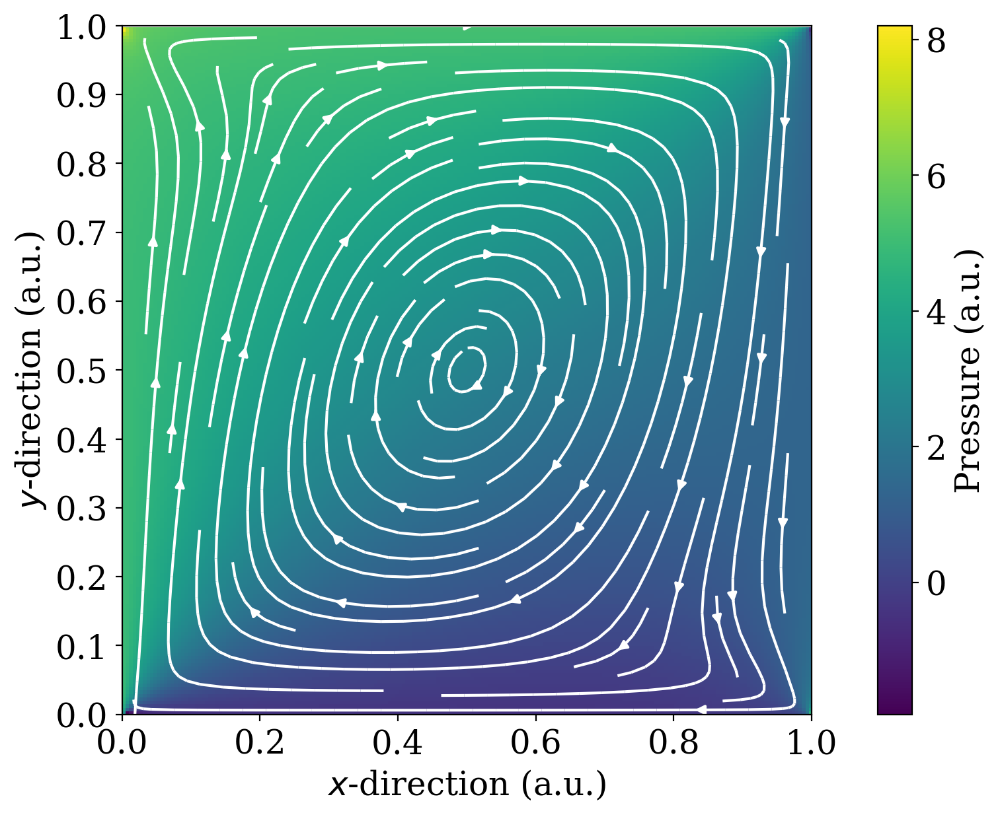

In [87]:
# Plot the velocity and / or pressure
save_fig = False
file_name = 'Re200_Vbot-1_VelStream_Pres'
path_name = 'Graphs\\Reynolds 200\\Vbot=-1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=True, quiver=False, p_plot=True, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

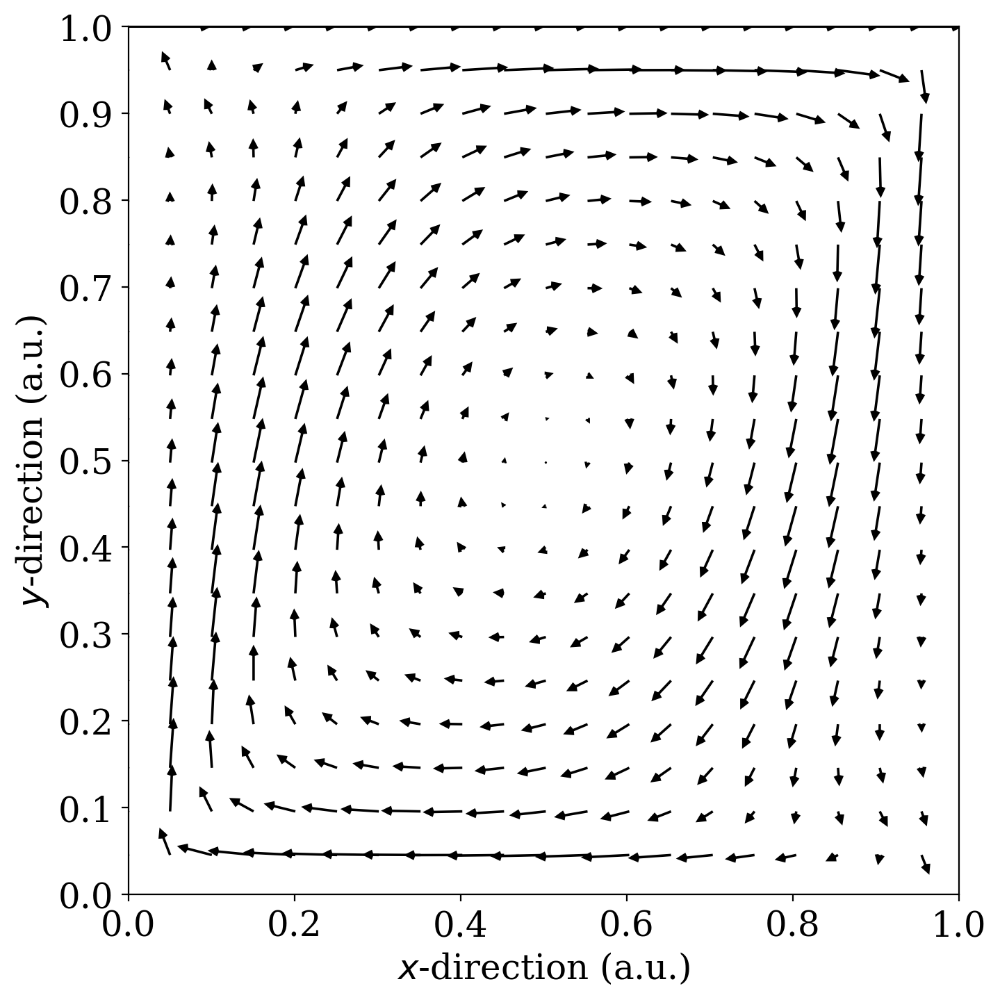

In [88]:
# Plot the velocity quiver
save_fig = False
file_name = 'Re200_Vbot-1_VelQuiver'
path_name = 'Graphs\\Reynolds 200\\Vbot=-1\\{0}'.format(file_name)

velocity_pressure_plot(Vx, Vy, p0, N, l, stream=False, quiver=True, p_plot=False, \
                       quiver_spacing=10, save_fig=save_fig, save_name=path_name)

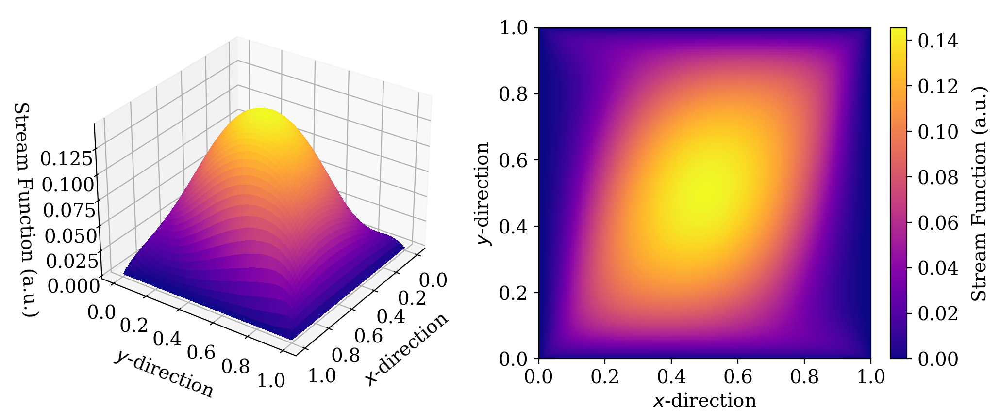

In [89]:
# Plot the stream function
save_fig = False
file_name = 'Re200_Vbot-1_StrFunc'
path_name = 'Graphs\\Reynolds 200\\Vbot=-1\\{0}'.format(file_name)

plot_stream_func(u0, N, l, elev_angle=30, azim_angle=35, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

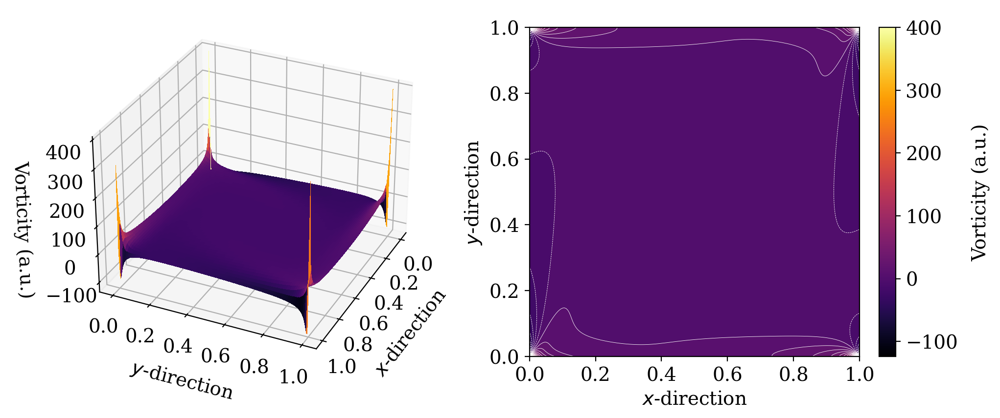

In [90]:
# Plot the vorticity
save_fig = False
file_name = 'Re200_Vbot-1_Vort'
path_name = 'Graphs\\Reynolds 200\\Vbot=-1\\{0}'.format(file_name)

plot_vorticity3D(w0, N, l, elev_angle=30, azim_angle=25, figure_size=10, font_size = 14, \
                     label_pad = 10, save_fig=save_fig, save_name=path_name)

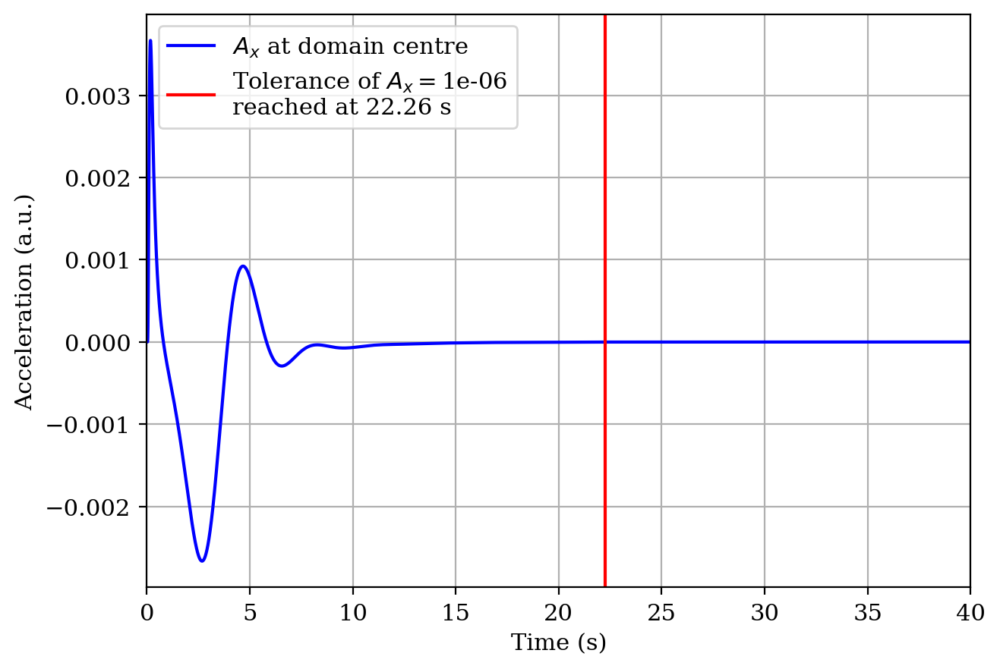

In [91]:
# Determine acceleration at domain centre from Vx_history
tolerance=1e-6

Ax, T0indexRe200_neg1, T0time = velocity_probe(Vx_history, Nt, dt, tolerance)

save_fig = False
file_name = 'Re200_Vbot-1_Accl'
path_name = 'Graphs\\Reynolds 200\\Vbot=-1\\{0}'.format(file_name)

# Plot acceleration in x-direction at domain centre
plot_acceleration(Ax, Nt, dt, T0indexRe200_neg1, tolerance, ylimits = [], xlimits=[0,40], \
                  save_fig=save_fig, save_name=path_name)

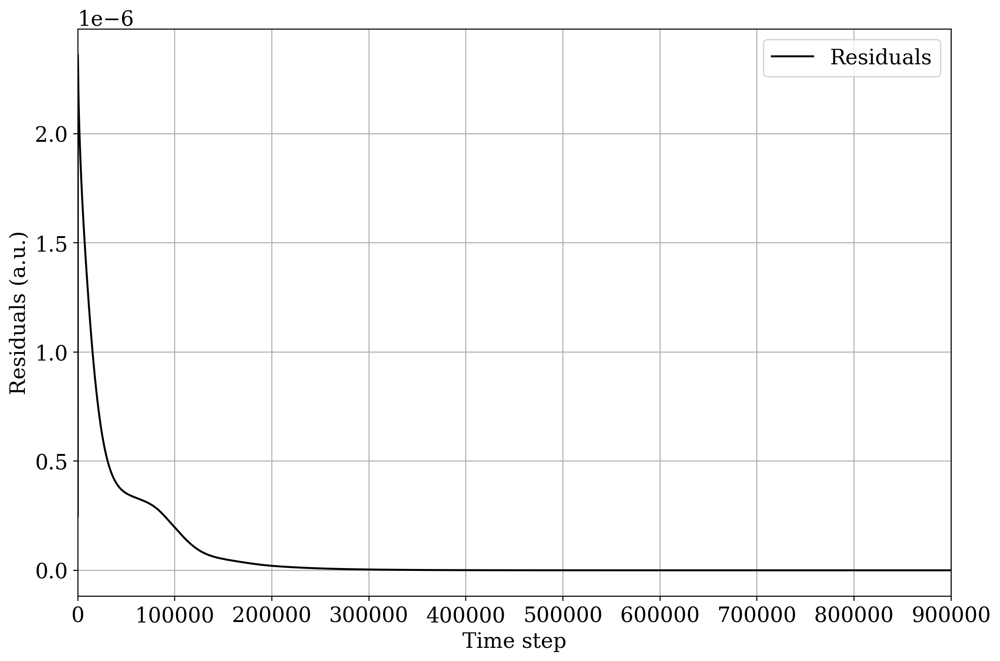

In [92]:
save_fig = False
file_name = 'Re200_Vbot-1_Residuals'
path_name = 'Graphs\\Reynolds 200\\Vbot=-1\\{0}'.format(file_name)
    
plotResiduals(u0_residuals, Nt=Nt, save_fig=save_fig, save_name=path_name, font_size=16)

# Reynolds number, steady-state, and moving bottom wall

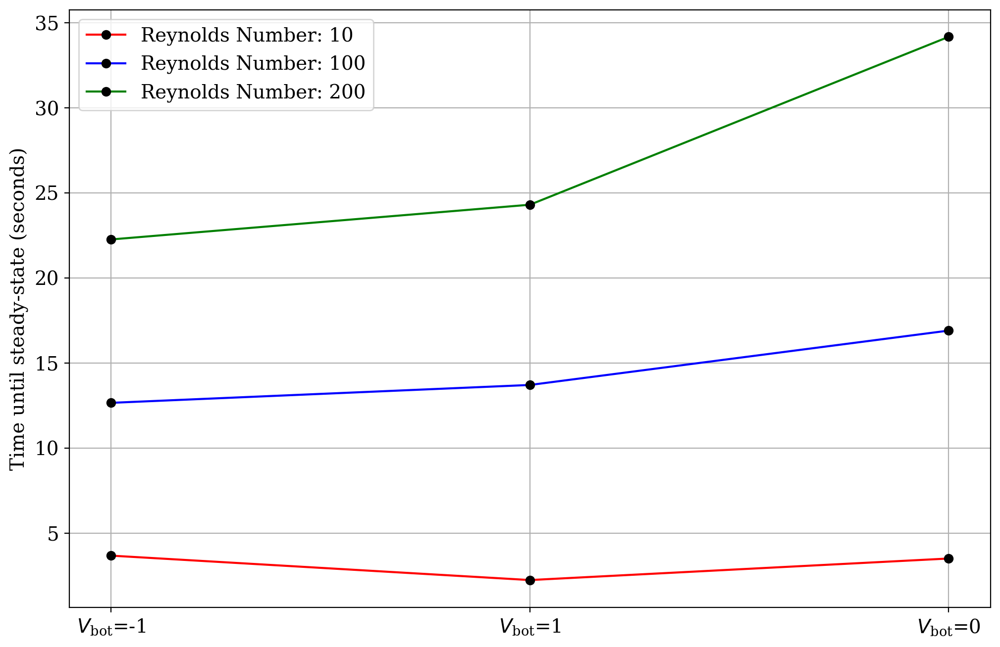

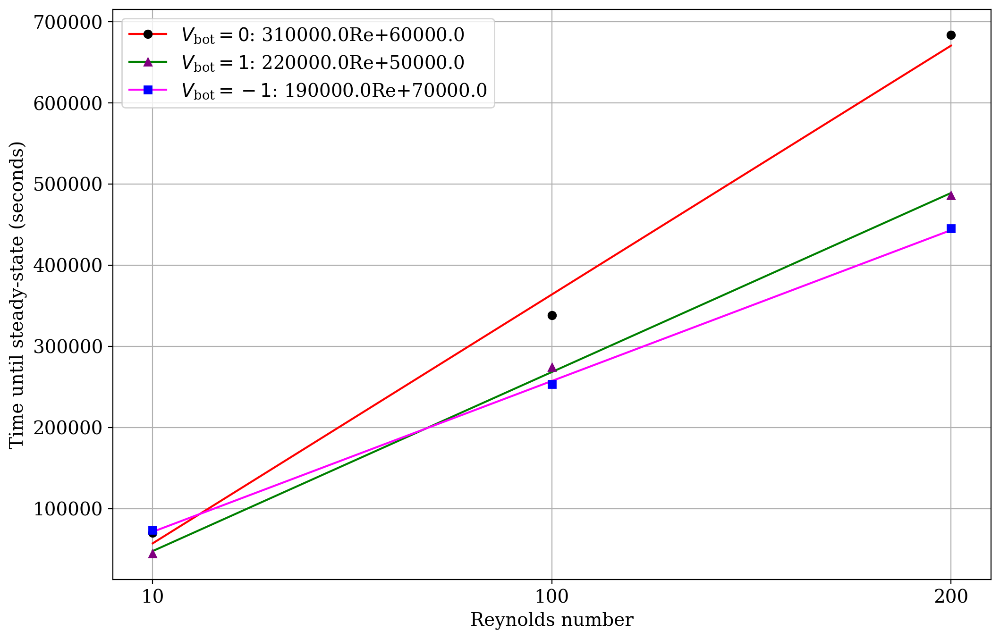

In [93]:
# Collect the times at which each situation reaches steady-state and plot 
# them according to Reynolds number, and vice versa
Re10 = np.array([T0indexRe10_neg1, T0indexRe10_1, T0indexRe10_0]) * dt
Re100 = np.array([T0indexRe100_neg1, T0indexRe100_1, T0indexRe100_0]) * dt
Re200 = np.array([T0indexRe200_neg1, T0indexRe200_1, T0indexRe200_0]) * dt

Vbot0 = np.array([T0indexRe10_0, T0indexRe100_0, T0indexRe200_0])
Vbot1 = np.array([T0indexRe10_1, T0indexRe100_1, T0indexRe200_1])
Vbotneg1 = np.array([T0indexRe10_neg1, T0indexRe100_neg1, T0indexRe200_neg1])

save_fig = False

file_name_Re = 'ReNo_SteadyState'
file_name_Vbot = 'Vbot_SteadyState'

plot_ReNo_StSt(Re10, Re100, Re200, save_fig=save_fig, save_name='Graphs\\{0}'.format(file_name_Re), font_size=14)
plot_Vbot_StSt(Vbot0, Vbot1, Vbotneg1, save_fig=save_fig, save_name='Graphs\\{0}'.format(file_name_Vbot), font_size=14)